In [ ]:
# Mount Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import os
import zipfile
import shutil

# Define Paths
drive_zip_path = '/content/drive/MyDrive/phase1_seasonal_38/phase1_seasonal_38.zip'
local_data_dir = '/content/data'
local_zip_path = os.path.join(local_data_dir, 'phase1_seasonal_38.zip')
extracted_folder = os.path.join(local_data_dir, 'phase1_seasonal_38')

# Check if local data directory exists
os.makedirs(local_data_dir, exist_ok=True)

# Copy zip from Drive
def copy_from_drive():
    print("copying zip from Drive")
    shutil.copy(drive_zip_path, local_zip_path)
    print("zip file copied to", local_zip_path)

need_copy = False
if not os.path.exists(local_zip_path):
    need_copy = True
else:
    # check if it’s a valid zip file
    if not zipfile.is_zipfile(local_zip_path):
        print("local zip is invalid or corrupted; re‑copying from Drive.")
        os.remove(local_zip_path)
        need_copy = True
    else:
        print("Valid zip already exists at", local_zip_path)

if need_copy:
    copy_from_drive()

# Extract if folder missing or empty
if not os.path.isdir(extracted_folder) or len(os.listdir(extracted_folder)) == 0:
    print("Extracting zip")
    with zipfile.ZipFile(local_zip_path, 'r') as zf:
        zf.extractall(local_data_dir)
    print("Extracted to", extracted_folder)
else:
    print("Files already extracted in", extracted_folder)

# List contents
print("\nFiles found in extracted folder:")
for fname in sorted(os.listdir(extracted_folder)):
    print("  ", fname)


Mounted at /content/drive
Valid zip already exists at /content/data/phase1_seasonal_38.zip
Files already extracted in /content/data/phase1_seasonal_38

Files found in extracted folder:
   .DS_Store
   2009_07_09_Site2_tls.las
   2009_08_04_Site2_tls.las
   2009_10_28_Site2_tls.las
   2010_09_07_Site2_tls.las
   2010_09_08_Site2_tls.las
   2010_09_09_Site2_tls.las
   2010_09_10_Site2_tls.las
   2010_09_11_Site2_tls.las
   2010_10_04_Site2_tls.las
   2010_10_07_Site2_tls.las
   2010_10_08_Site2_tls.las
   2010_10_11_Site2_tls.las
   2010_10_22_Site2_tls.las
   2011_07_22_Site2_tls.las
   2011_09_23_Site2_tls.las
   2011_09_26_Site2_tls.las
   2011_09_27_Site2_tls.las
   2011_09_28_Site2_tls.las
   2011_09_29_Site2_tls.las
   2011_09_30_Site2_tls.las
   2011_10_03_Site2_tls.las
   2012_03_28_Site2_tls.las
   2012_04_06_Site2_tls.las
   2012_04_08_Site2_tls.las
   2012_05_03_Site2_tls.las
   2012_06_11_Site2_tls.las
   2012_07_09_Site2_tls.las
   2012_08_23_Site2_tls.las
   2012_10_12_Site

In [ ]:
# Install and import necessary libraries
!pip install -q py4dgeo pykalman

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import py4dgeo
import laspy
from pykalman import KalmanFilter
from datetime import datetime

# Data path
las_folder = "/content/data/phase1_seasonal_38"
zip_path = "/content/data/phase1_seasonal_38.zip"
timestamp_csv = os.path.join(las_folder, "timestamps.csv")

# Check for timestamp CSV
assert os.path.exists(timestamp_csv), f"Missing: {timestamp_csv}"

# Read and sort the timestamps CSV to get epoch filenames and times
df = pd.read_csv(timestamp_csv, encoding='latin1')
df['timestamp'] = pd.to_datetime(df['timestamp'])
df = df.sort_values('timestamp').reset_index(drop=True)
las_files = df['filename'].tolist()
timestamps = df['timestamp'].tolist()

# Display info
print(f"Loaded {len(las_files)} LAS files from {las_folder}")
print(df.head(3))
print(f"Time range: {df['timestamp'].min().date()} to {df['timestamp'].max().date()}")


Loaded 38 LAS files from /content/data/phase1_seasonal_38
                   filename  timestamp
0  2009_07_09_Site2_tls.las 2009-07-09
1  2009_08_04_Site2_tls.las 2009-08-04
2  2009_10_28_Site2_tls.las 2009-10-28
Time range: 2009-07-09 to 2017-01-24


In [ ]:
# Initialize SpatiotemporalAnalysis with reference epoch and corepoints

reference_file = os.path.join(las_folder, las_files[0])
reference_epoch = py4dgeo.read_from_las(reference_file)
reference_epoch.timestamp = timestamps[0]

# analysis = py4dgeo.SpatiotemporalAnalysis(las_folder, force=True)
analysis = py4dgeo.SpatiotemporalAnalysis(zip_path, force=True)
analysis.reference_epoch = reference_epoch

# specify corepoints, here all points of the reference epoch
analysis.corepoints = reference_epoch.cloud[::]

# specify M3C2 parameters
analysis.m3c2 = py4dgeo.M3C2(cyl_radii=(1.0,), normal_radii=(1.0,), max_distance=10.0, registration_error = 0.025)

# Add all other epochs
for f, ts in zip(las_files[1:], timestamps[1:]):
    epoch = py4dgeo.read_from_las(os.path.join(las_folder, f))
    epoch.timestamp = ts
    analysis.add_epochs(epoch)

print(f"Loaded {len(las_files) - 1} epochs + 1 reference epoch")

[2025-08-20 17:28:25][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2009_07_09_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2009_07_09_Site2_tls.las'


[2025-08-20 17:28:25][INFO] Creating analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Creating analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:28:25][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:28:25][INFO] Saving epoch to file '/tmp/tmp0668pojr/reference_epoch.zip'


INFO:py4dgeo:Saving epoch to file '/tmp/tmp0668pojr/reference_epoch.zip'


[2025-08-20 17:28:25][INFO] Saving a file without normals.


INFO:py4dgeo:Saving a file without normals.


[2025-08-20 17:28:25][INFO] Initializing Epoch object from given point cloud


INFO:py4dgeo:Initializing Epoch object from given point cloud


[2025-08-20 17:28:25][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:28:26][INFO] Saving epoch to file '/tmp/tmpr8yey05_/corepoints.zip'


INFO:py4dgeo:Saving epoch to file '/tmp/tmpr8yey05_/corepoints.zip'


[2025-08-20 17:28:26][INFO] Saving a file without normals.


INFO:py4dgeo:Saving a file without normals.


[2025-08-20 17:28:26][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2009_08_04_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2009_08_04_Site2_tls.las'


[2025-08-20 17:28:26][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:28:26][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object
[2025-08-20 17:28:26][WARNING] DEPRECATION: use cyl_radius instead of cyl_radii. In a future version, cyl_radii will be removed!


[2025-08-20 17:28:26][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:28:30][INFO] Finished in 3.7312s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 3.7312s: Adding epoch 1/1 to analysis object


[2025-08-20 17:28:30][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:28:30][INFO] Finished in 0.5502s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 0.5502s: Rearranging space-time array in memory


[2025-08-20 17:28:30][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:28:30][INFO] Finished in 0.0220s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.0220s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:28:30][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2009_10_28_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2009_10_28_Site2_tls.las'


[2025-08-20 17:28:31][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:28:31][INFO] Restoring epoch from file '/tmp/tmptm9fl6sq/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmptm9fl6sq/reference_epoch.zip'


[2025-08-20 17:28:31][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:28:31][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:28:33][INFO] Finished in 1.8126s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 1.8126s: Adding epoch 1/1 to analysis object


[2025-08-20 17:28:33][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:28:34][INFO] Finished in 1.0030s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 1.0030s: Rearranging space-time array in memory


[2025-08-20 17:28:34][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:28:34][INFO] Finished in 0.0357s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.0357s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:28:34][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2010_09_07_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2010_09_07_Site2_tls.las'


[2025-08-20 17:28:36][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:28:36][INFO] Restoring epoch from file '/tmp/tmpupxw7znw/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpupxw7znw/reference_epoch.zip'


[2025-08-20 17:28:36][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:28:36][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:28:49][INFO] Finished in 12.7823s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 12.7823s: Adding epoch 1/1 to analysis object


[2025-08-20 17:28:49][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:28:51][INFO] Finished in 1.3455s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 1.3455s: Rearranging space-time array in memory


[2025-08-20 17:28:51][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:28:51][INFO] Finished in 0.0445s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.0445s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:28:51][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2010_09_08_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2010_09_08_Site2_tls.las'


[2025-08-20 17:28:56][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:28:56][INFO] Restoring epoch from file '/tmp/tmp2l_4t9pm/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmp2l_4t9pm/reference_epoch.zip'


[2025-08-20 17:28:56][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:28:56][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:29:19][INFO] Finished in 22.7819s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 22.7819s: Adding epoch 1/1 to analysis object


[2025-08-20 17:29:19][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:29:21][INFO] Finished in 1.6900s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 1.6900s: Rearranging space-time array in memory


[2025-08-20 17:29:21][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:29:21][INFO] Finished in 0.0748s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.0748s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:29:21][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2010_09_09_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2010_09_09_Site2_tls.las'


[2025-08-20 17:29:24][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:29:24][INFO] Restoring epoch from file '/tmp/tmpxrtb8wec/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpxrtb8wec/reference_epoch.zip'


[2025-08-20 17:29:25][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:29:25][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:29:42][INFO] Finished in 17.6062s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 17.6062s: Adding epoch 1/1 to analysis object


[2025-08-20 17:29:42][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:29:44][INFO] Finished in 1.8384s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 1.8384s: Rearranging space-time array in memory


[2025-08-20 17:29:44][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:29:44][INFO] Finished in 0.0608s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.0608s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:29:44][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2010_09_10_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2010_09_10_Site2_tls.las'


[2025-08-20 17:29:49][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:29:49][INFO] Restoring epoch from file '/tmp/tmpdizq8dsu/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpdizq8dsu/reference_epoch.zip'


[2025-08-20 17:29:49][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:29:49][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:30:12][INFO] Finished in 22.4725s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 22.4725s: Adding epoch 1/1 to analysis object


[2025-08-20 17:30:12][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:30:14][INFO] Finished in 2.1161s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 2.1161s: Rearranging space-time array in memory


[2025-08-20 17:30:14][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:30:14][INFO] Finished in 0.0682s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.0682s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:30:14][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2010_09_11_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2010_09_11_Site2_tls.las'


[2025-08-20 17:30:16][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:30:16][INFO] Restoring epoch from file '/tmp/tmpirdhyoar/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpirdhyoar/reference_epoch.zip'


[2025-08-20 17:30:16][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:30:16][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:30:24][INFO] Finished in 8.3147s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 8.3147s: Adding epoch 1/1 to analysis object


[2025-08-20 17:30:24][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:30:27][INFO] Finished in 2.2926s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 2.2926s: Rearranging space-time array in memory


[2025-08-20 17:30:27][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:30:27][INFO] Finished in 0.0715s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.0715s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:30:27][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2010_10_04_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2010_10_04_Site2_tls.las'


[2025-08-20 17:30:30][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:30:30][INFO] Restoring epoch from file '/tmp/tmp_tj_wdr4/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmp_tj_wdr4/reference_epoch.zip'


[2025-08-20 17:30:31][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:30:31][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:30:47][INFO] Finished in 16.1414s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 16.1414s: Adding epoch 1/1 to analysis object


[2025-08-20 17:30:47][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:30:49][INFO] Finished in 2.5627s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 2.5627s: Rearranging space-time array in memory


[2025-08-20 17:30:49][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:30:50][INFO] Finished in 0.0885s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.0885s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:30:50][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2010_10_07_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2010_10_07_Site2_tls.las'


[2025-08-20 17:30:52][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:30:52][INFO] Restoring epoch from file '/tmp/tmp81yrd0md/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmp81yrd0md/reference_epoch.zip'


[2025-08-20 17:30:53][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:30:53][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:31:07][INFO] Finished in 14.6765s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 14.6765s: Adding epoch 1/1 to analysis object


[2025-08-20 17:31:07][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:31:11][INFO] Finished in 3.3771s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 3.3771s: Rearranging space-time array in memory


[2025-08-20 17:31:11][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:31:11][INFO] Finished in 0.1179s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.1179s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:31:11][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2010_10_08_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2010_10_08_Site2_tls.las'


[2025-08-20 17:31:15][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:31:15][INFO] Restoring epoch from file '/tmp/tmp8agxga4c/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmp8agxga4c/reference_epoch.zip'


[2025-08-20 17:31:15][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:31:15][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:31:31][INFO] Finished in 16.5720s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 16.5720s: Adding epoch 1/1 to analysis object


[2025-08-20 17:31:31][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:31:35][INFO] Finished in 3.0625s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 3.0625s: Rearranging space-time array in memory


[2025-08-20 17:31:35][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:31:35][INFO] Finished in 0.1015s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.1015s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:31:35][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2010_10_11_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2010_10_11_Site2_tls.las'


[2025-08-20 17:31:39][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:31:39][INFO] Restoring epoch from file '/tmp/tmpbzkq3mkj/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpbzkq3mkj/reference_epoch.zip'


[2025-08-20 17:31:40][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:31:40][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:31:59][INFO] Finished in 19.8066s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 19.8066s: Adding epoch 1/1 to analysis object


[2025-08-20 17:31:59][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:32:03][INFO] Finished in 3.7189s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 3.7189s: Rearranging space-time array in memory


[2025-08-20 17:32:03][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:32:03][INFO] Finished in 0.1571s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.1571s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:32:03][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2010_10_22_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2010_10_22_Site2_tls.las'


[2025-08-20 17:32:08][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:32:08][INFO] Restoring epoch from file '/tmp/tmpe0fd7ftx/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpe0fd7ftx/reference_epoch.zip'


[2025-08-20 17:32:08][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:32:08][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:32:29][INFO] Finished in 20.9014s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 20.9014s: Adding epoch 1/1 to analysis object


[2025-08-20 17:32:29][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:32:33][INFO] Finished in 4.2011s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 4.2011s: Rearranging space-time array in memory


[2025-08-20 17:32:33][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:32:34][INFO] Finished in 0.1433s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.1433s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:32:34][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2011_07_22_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2011_07_22_Site2_tls.las'


[2025-08-20 17:32:38][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:32:38][INFO] Restoring epoch from file '/tmp/tmpvk44eni1/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpvk44eni1/reference_epoch.zip'


[2025-08-20 17:32:38][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:32:38][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:33:00][INFO] Finished in 22.3919s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 22.3919s: Adding epoch 1/1 to analysis object


[2025-08-20 17:33:00][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:33:04][INFO] Finished in 3.8988s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 3.8988s: Rearranging space-time array in memory


[2025-08-20 17:33:04][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:33:05][INFO] Finished in 0.1108s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.1108s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:33:05][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2011_09_23_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2011_09_23_Site2_tls.las'


[2025-08-20 17:33:10][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:33:10][INFO] Restoring epoch from file '/tmp/tmpek0fukkf/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpek0fukkf/reference_epoch.zip'


[2025-08-20 17:33:10][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:33:10][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:33:34][INFO] Finished in 23.5505s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 23.5505s: Adding epoch 1/1 to analysis object


[2025-08-20 17:33:34][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:33:38][INFO] Finished in 4.5474s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 4.5474s: Rearranging space-time array in memory


[2025-08-20 17:33:38][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:33:38][INFO] Finished in 0.1951s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.1951s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:33:38][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2011_09_26_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2011_09_26_Site2_tls.las'


[2025-08-20 17:33:44][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:33:44][INFO] Restoring epoch from file '/tmp/tmpetz8f3wu/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpetz8f3wu/reference_epoch.zip'


[2025-08-20 17:33:44][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:33:44][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:34:07][INFO] Finished in 23.3672s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 23.3672s: Adding epoch 1/1 to analysis object


[2025-08-20 17:34:07][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:34:12][INFO] Finished in 4.5430s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 4.5430s: Rearranging space-time array in memory


[2025-08-20 17:34:12][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:34:12][INFO] Finished in 0.1573s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.1573s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:34:12][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2011_09_27_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2011_09_27_Site2_tls.las'


[2025-08-20 17:34:16][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:34:16][INFO] Restoring epoch from file '/tmp/tmpentv23vz/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpentv23vz/reference_epoch.zip'


[2025-08-20 17:34:16][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:34:16][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:34:36][INFO] Finished in 19.5857s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 19.5857s: Adding epoch 1/1 to analysis object


[2025-08-20 17:34:36][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:34:41][INFO] Finished in 4.7155s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 4.7155s: Rearranging space-time array in memory


[2025-08-20 17:34:41][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:34:41][INFO] Finished in 0.1712s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.1712s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:34:41][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2011_09_28_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2011_09_28_Site2_tls.las'


[2025-08-20 17:34:46][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:34:46][INFO] Restoring epoch from file '/tmp/tmpb2doothe/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpb2doothe/reference_epoch.zip'


[2025-08-20 17:34:46][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:34:46][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:35:09][INFO] Finished in 22.7602s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 22.7602s: Adding epoch 1/1 to analysis object


[2025-08-20 17:35:09][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:35:14][INFO] Finished in 5.1998s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 5.1998s: Rearranging space-time array in memory


[2025-08-20 17:35:14][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:35:14][INFO] Finished in 0.2117s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.2117s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:35:15][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2011_09_29_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2011_09_29_Site2_tls.las'


[2025-08-20 17:35:18][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:35:18][INFO] Restoring epoch from file '/tmp/tmpwiajj7l1/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpwiajj7l1/reference_epoch.zip'


[2025-08-20 17:35:18][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:35:18][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:35:36][INFO] Finished in 17.2259s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 17.2259s: Adding epoch 1/1 to analysis object


[2025-08-20 17:35:36][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:35:41][INFO] Finished in 5.5112s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 5.5112s: Rearranging space-time array in memory


[2025-08-20 17:35:41][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:35:41][INFO] Finished in 0.2735s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.2735s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:35:41][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2011_09_30_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2011_09_30_Site2_tls.las'


[2025-08-20 17:35:42][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:35:42][INFO] Restoring epoch from file '/tmp/tmpcaeid9px/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpcaeid9px/reference_epoch.zip'


[2025-08-20 17:35:43][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:35:43][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:35:47][INFO] Finished in 4.2230s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 4.2230s: Adding epoch 1/1 to analysis object


[2025-08-20 17:35:47][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:35:52][INFO] Finished in 5.4095s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 5.4095s: Rearranging space-time array in memory


[2025-08-20 17:35:52][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:35:52][INFO] Finished in 0.2308s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.2308s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:35:52][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2011_10_03_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2011_10_03_Site2_tls.las'


[2025-08-20 17:35:58][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:35:58][INFO] Restoring epoch from file '/tmp/tmpgf1q5j48/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpgf1q5j48/reference_epoch.zip'


[2025-08-20 17:35:59][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:35:59][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:36:26][INFO] Finished in 26.9138s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 26.9138s: Adding epoch 1/1 to analysis object


[2025-08-20 17:36:26][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:36:31][INFO] Finished in 5.7462s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 5.7462s: Rearranging space-time array in memory


[2025-08-20 17:36:31][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:36:32][INFO] Finished in 0.2387s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.2387s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:36:32][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2012_03_28_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2012_03_28_Site2_tls.las'


[2025-08-20 17:36:38][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:36:38][INFO] Restoring epoch from file '/tmp/tmpaslgh2q4/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpaslgh2q4/reference_epoch.zip'


[2025-08-20 17:36:38][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:36:38][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:36:59][INFO] Finished in 20.5201s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 20.5201s: Adding epoch 1/1 to analysis object


[2025-08-20 17:36:59][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:37:06][INFO] Finished in 6.8416s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 6.8416s: Rearranging space-time array in memory


[2025-08-20 17:37:06][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:37:06][INFO] Finished in 0.2369s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.2369s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:37:06][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2012_04_06_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2012_04_06_Site2_tls.las'


[2025-08-20 17:37:11][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:37:11][INFO] Restoring epoch from file '/tmp/tmpb7hv27gh/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpb7hv27gh/reference_epoch.zip'


[2025-08-20 17:37:11][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:37:11][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:37:29][INFO] Finished in 17.6319s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 17.6319s: Adding epoch 1/1 to analysis object


[2025-08-20 17:37:29][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:37:36][INFO] Finished in 6.7005s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 6.7005s: Rearranging space-time array in memory


[2025-08-20 17:37:36][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:37:36][INFO] Finished in 0.2716s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.2716s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:37:36][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2012_04_08_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2012_04_08_Site2_tls.las'


[2025-08-20 17:37:38][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:37:38][INFO] Restoring epoch from file '/tmp/tmp2y826jsf/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmp2y826jsf/reference_epoch.zip'


[2025-08-20 17:37:38][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:37:38][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:37:48][INFO] Finished in 10.5203s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 10.5203s: Adding epoch 1/1 to analysis object


[2025-08-20 17:37:48][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:37:55][INFO] Finished in 6.5794s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 6.5794s: Rearranging space-time array in memory


[2025-08-20 17:37:55][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:37:55][INFO] Finished in 0.3193s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.3193s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:37:55][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2012_05_03_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2012_05_03_Site2_tls.las'


[2025-08-20 17:38:01][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:38:01][INFO] Restoring epoch from file '/tmp/tmp9338bnc9/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmp9338bnc9/reference_epoch.zip'


[2025-08-20 17:38:02][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:38:02][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:38:21][INFO] Finished in 18.8174s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 18.8174s: Adding epoch 1/1 to analysis object


[2025-08-20 17:38:21][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:38:28][INFO] Finished in 7.6532s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 7.6532s: Rearranging space-time array in memory


[2025-08-20 17:38:28][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:38:28][INFO] Finished in 0.2501s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.2501s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:38:28][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2012_06_11_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2012_06_11_Site2_tls.las'


[2025-08-20 17:38:31][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:38:31][INFO] Restoring epoch from file '/tmp/tmpef7kt660/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpef7kt660/reference_epoch.zip'


[2025-08-20 17:38:31][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:38:32][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:38:43][INFO] Finished in 11.8391s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 11.8391s: Adding epoch 1/1 to analysis object


[2025-08-20 17:38:43][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:38:51][INFO] Finished in 7.7280s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 7.7280s: Rearranging space-time array in memory


[2025-08-20 17:38:51][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:38:51][INFO] Finished in 0.3227s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.3227s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:38:51][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2012_07_09_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2012_07_09_Site2_tls.las'


[2025-08-20 17:39:02][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:39:02][INFO] Restoring epoch from file '/tmp/tmp09le8lg4/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmp09le8lg4/reference_epoch.zip'


[2025-08-20 17:39:02][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:39:02][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:39:38][INFO] Finished in 35.7817s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 35.7817s: Adding epoch 1/1 to analysis object


[2025-08-20 17:39:38][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:39:46][INFO] Finished in 7.9284s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 7.9284s: Rearranging space-time array in memory


[2025-08-20 17:39:46][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:39:46][INFO] Finished in 0.3412s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.3412s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:39:46][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2012_08_23_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2012_08_23_Site2_tls.las'


[2025-08-20 17:39:51][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:39:51][INFO] Restoring epoch from file '/tmp/tmpxkq4c354/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpxkq4c354/reference_epoch.zip'


[2025-08-20 17:39:52][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:39:52][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:40:09][INFO] Finished in 17.4044s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 17.4044s: Adding epoch 1/1 to analysis object


[2025-08-20 17:40:09][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:40:17][INFO] Finished in 8.2195s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 8.2195s: Rearranging space-time array in memory


[2025-08-20 17:40:17][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:40:18][INFO] Finished in 0.5215s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.5215s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:40:18][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2012_10_12_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2012_10_12_Site2_tls.las'


[2025-08-20 17:40:20][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:40:20][INFO] Restoring epoch from file '/tmp/tmpfaslsyx8/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpfaslsyx8/reference_epoch.zip'


[2025-08-20 17:40:21][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:40:21][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:40:34][INFO] Finished in 13.1471s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 13.1471s: Adding epoch 1/1 to analysis object


[2025-08-20 17:40:34][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:40:42][INFO] Finished in 8.5064s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 8.5064s: Rearranging space-time array in memory


[2025-08-20 17:40:42][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:40:43][INFO] Finished in 0.3419s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.3419s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:40:43][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2012_11_29_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2012_11_29_Site2_tls.las'


[2025-08-20 17:40:48][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:40:48][INFO] Restoring epoch from file '/tmp/tmpxvl8mqni/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpxvl8mqni/reference_epoch.zip'


[2025-08-20 17:40:49][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:40:49][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:41:09][INFO] Finished in 20.2843s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 20.2843s: Adding epoch 1/1 to analysis object


[2025-08-20 17:41:09][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:41:17][INFO] Finished in 7.8746s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 7.8746s: Rearranging space-time array in memory


[2025-08-20 17:41:17][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:41:17][INFO] Finished in 0.3090s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.3090s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:41:17][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2013_03_22_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2013_03_22_Site2_tls.las'


[2025-08-20 17:41:21][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:41:21][INFO] Restoring epoch from file '/tmp/tmpmoay9x_n/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpmoay9x_n/reference_epoch.zip'


[2025-08-20 17:41:22][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:41:22][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:41:35][INFO] Finished in 13.4915s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 13.4915s: Adding epoch 1/1 to analysis object


[2025-08-20 17:41:35][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:41:43][INFO] Finished in 8.2352s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 8.2352s: Rearranging space-time array in memory


[2025-08-20 17:41:43][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:41:44][INFO] Finished in 0.3687s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.3687s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:41:44][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2013_03_27_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2013_03_27_Site2_tls.las'


[2025-08-20 17:41:49][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:41:49][INFO] Restoring epoch from file '/tmp/tmp0q3u4ps5/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmp0q3u4ps5/reference_epoch.zip'


[2025-08-20 17:41:49][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:41:49][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:42:07][INFO] Finished in 17.6408s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 17.6408s: Adding epoch 1/1 to analysis object


[2025-08-20 17:42:07][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:42:16][INFO] Finished in 9.2969s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 9.2969s: Rearranging space-time array in memory


[2025-08-20 17:42:16][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:42:17][INFO] Finished in 0.5542s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.5542s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:42:17][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2013_03_28_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2013_03_28_Site2_tls.las'


[2025-08-20 17:42:21][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:42:21][INFO] Restoring epoch from file '/tmp/tmpj0sa6_hy/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpj0sa6_hy/reference_epoch.zip'


[2025-08-20 17:42:21][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:42:21][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:42:42][INFO] Finished in 20.4108s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 20.4108s: Adding epoch 1/1 to analysis object


[2025-08-20 17:42:42][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:42:51][INFO] Finished in 8.6662s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 8.6662s: Rearranging space-time array in memory


[2025-08-20 17:42:51][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:42:51][INFO] Finished in 0.3207s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.3207s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:42:51][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2013_03_29_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2013_03_29_Site2_tls.las'


[2025-08-20 17:42:56][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:42:56][INFO] Restoring epoch from file '/tmp/tmpfhb5ztvh/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpfhb5ztvh/reference_epoch.zip'


[2025-08-20 17:42:56][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:42:57][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:43:13][INFO] Finished in 16.9071s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 16.9071s: Adding epoch 1/1 to analysis object


[2025-08-20 17:43:13][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:43:23][INFO] Finished in 9.6784s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 9.6784s: Rearranging space-time array in memory


[2025-08-20 17:43:23][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:43:24][INFO] Finished in 0.6284s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.6284s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:43:24][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2013_04_03_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2013_04_03_Site2_tls.las'


[2025-08-20 17:43:28][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:43:28][INFO] Restoring epoch from file '/tmp/tmpmyqd5luu/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpmyqd5luu/reference_epoch.zip'


[2025-08-20 17:43:28][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:43:28][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:43:40][INFO] Finished in 12.0376s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 12.0376s: Adding epoch 1/1 to analysis object


[2025-08-20 17:43:40][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:43:50][INFO] Finished in 9.9723s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 9.9723s: Rearranging space-time array in memory


[2025-08-20 17:43:50][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:43:51][INFO] Finished in 0.4316s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.4316s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:43:51][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2013_07_22_Site2_tls.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2013_07_22_Site2_tls.las'


[2025-08-20 17:43:55][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:43:55][INFO] Restoring epoch from file '/tmp/tmpm8bnn5i_/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpm8bnn5i_/reference_epoch.zip'


[2025-08-20 17:43:56][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:43:56][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:44:16][INFO] Finished in 20.4448s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 20.4448s: Adding epoch 1/1 to analysis object


[2025-08-20 17:44:16][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:44:26][INFO] Finished in 9.5085s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 9.5085s: Rearranging space-time array in memory


[2025-08-20 17:44:26][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:44:26][INFO] Finished in 0.6651s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.6651s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:44:26][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2015_06_08_Site2_airborne.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2015_06_08_Site2_airborne.las'


[2025-08-20 17:44:27][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:44:27][INFO] Restoring epoch from file '/tmp/tmp47dl3jwb/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmp47dl3jwb/reference_epoch.zip'


[2025-08-20 17:44:27][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:44:27][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:44:31][INFO] Finished in 3.4571s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 3.4571s: Adding epoch 1/1 to analysis object


[2025-08-20 17:44:31][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:44:41][INFO] Finished in 10.2273s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 10.2273s: Rearranging space-time array in memory


[2025-08-20 17:44:41][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:44:42][INFO] Finished in 0.4987s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.4987s: Updating disk-based analysis archive with new epochs


[2025-08-20 17:44:42][INFO] Reading point cloud from file '/content/data/phase1_seasonal_38/2017_01_24_Site2_airborne.las'


INFO:py4dgeo:Reading point cloud from file '/content/data/phase1_seasonal_38/2017_01_24_Site2_airborne.las'


[2025-08-20 17:44:42][INFO] Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


INFO:py4dgeo:Removing intermediate results from the analysis file /content/data/phase1_seasonal_38.zip


[2025-08-20 17:44:42][INFO] Restoring epoch from file '/tmp/tmpiskkjjpu/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpiskkjjpu/reference_epoch.zip'


[2025-08-20 17:44:42][INFO] Starting: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Starting: Adding epoch 1/1 to analysis object


[2025-08-20 17:44:42][INFO] Building KDTree structure with leaf parameter 10


INFO:py4dgeo:Building KDTree structure with leaf parameter 10


[2025-08-20 17:44:44][INFO] Finished in 2.2044s: Adding epoch 1/1 to analysis object


INFO:py4dgeo:Finished in 2.2044s: Adding epoch 1/1 to analysis object


[2025-08-20 17:44:44][INFO] Starting: Rearranging space-time array in memory


INFO:py4dgeo:Starting: Rearranging space-time array in memory


[2025-08-20 17:44:55][INFO] Finished in 10.8174s: Rearranging space-time array in memory


INFO:py4dgeo:Finished in 10.8174s: Rearranging space-time array in memory


[2025-08-20 17:44:55][INFO] Starting: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Starting: Updating disk-based analysis archive with new epochs


[2025-08-20 17:44:56][INFO] Finished in 0.4809s: Updating disk-based analysis archive with new epochs


INFO:py4dgeo:Finished in 0.4809s: Updating disk-based analysis archive with new epochs


Loaded 37 epochs + 1 reference epoch


In [ ]:
# print the spatiotemporal analysis data for 3 corepoints and 5 epochs, respectively
print(f"Space-time distance array:\n{analysis.distances[:3,:5]}")
print(f"Uncertainties of M3C2 distance calculation:\n{analysis.uncertainties['lodetection'][:3, :5]}")
print(f"Timestamp deltas of analysis:\n{analysis.timedeltas[:5]}")

Space-time distance array:
[[        nan         nan         nan         nan         nan]
 [        nan -0.05804443         nan         nan         nan]
 [        nan -0.03422864         nan         nan         nan]]
Uncertainties of M3C2 distance calculation:
[[       nan        nan        nan        nan        nan]
 [       nan 0.10385238        nan        nan        nan]
 [       nan 0.08037596        nan        nan        nan]]
Timestamp deltas of analysis:
[datetime.timedelta(days=26), datetime.timedelta(days=111), datetime.timedelta(days=425), datetime.timedelta(days=426), datetime.timedelta(days=427)]


[2025-08-20 17:44:58][INFO] Restoring epoch from file '/tmp/tmpf8kswmj9/reference_epoch.zip'


INFO:py4dgeo:Restoring epoch from file '/tmp/tmpf8kswmj9/reference_epoch.zip'


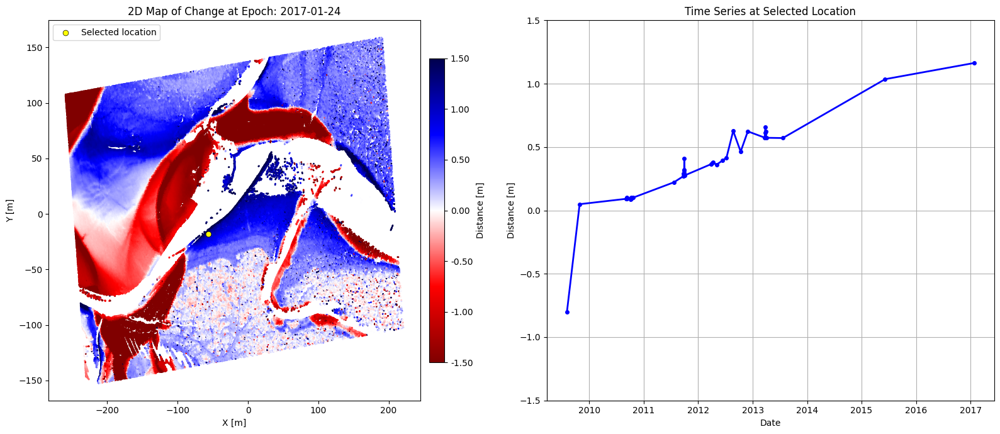

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

# Create the figure with two 2D subplots
fig = plt.figure(figsize=(16, 7))
ax1 = fig.add_subplot(1, 2, 1)  # 2D instead of 3D
ax2 = fig.add_subplot(1, 2, 2)

# Get corepoints and distances from analysis
corepoints = analysis.corepoints.cloud
distances = analysis.distances

# Use the last epoch (index -1 for 38th epoch)
epoch_index = -1
distances_epoch = distances[:, epoch_index]
plot_time = analysis.reference_epoch.timestamp + analysis.timedeltas[epoch_index]

# Choose a corepoint index safely
cp_idx_sel = 86960
if cp_idx_sel >= len(corepoints):
    cp_idx_sel = len(corepoints) // 2

coord_sel = corepoints[cp_idx_sel]
timeseries_sel = distances[cp_idx_sel]

# Build timestamp list
timestamps_plot = [analysis.reference_epoch.timestamp + t for t in analysis.timedeltas]

# Plot 2D scatter (X vs Y), colored by distance
d = ax1.scatter(corepoints[:, 0], corepoints[:, 1],
                c=distances_epoch, cmap='seismic_r', vmin=-1.5, vmax=1.5, s=1)

plt.colorbar(d, format='%.2f', label='Distance [m]', ax=ax1, shrink=0.8, pad=0.02)

# Highlight selected corepoint
ax1.scatter(coord_sel[0], coord_sel[1],
            c='yellow', s=40, edgecolor='black', linewidth=0.5,
            label='Selected location')

ax1.set_xlabel('X [m]')
ax1.set_ylabel('Y [m]')
ax1.legend()
ax1.set_title(f'2D Map of Change at Epoch: {plot_time.date()}')

# Plot the time series
ax2.plot(timestamps_plot, timeseries_sel,
         color='blue', linewidth=2, marker='o', markersize=4)

ax2.set_xlabel('Date')
ax2.set_ylabel('Distance [m]')
ax2.grid(True)
ax2.set_ylim(-1.5, 1.5)
ax2.set_title('Time Series at Selected Location')

plt.tight_layout()
plt.show()


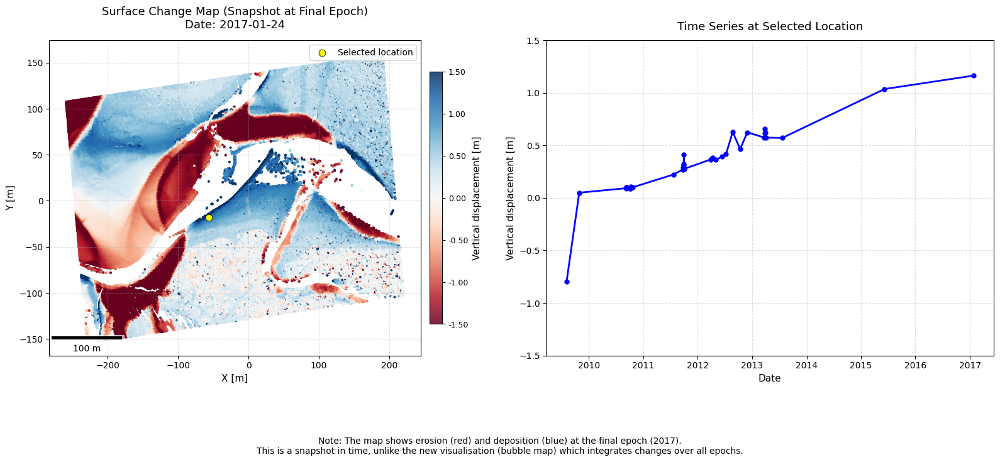

In [ ]:
import matplotlib.pyplot as plt
!pip install matplotlib-scalebar
from matplotlib_scalebar.scalebar import ScaleBar
%matplotlib inline

# --- Create figure ---
fig = plt.figure(figsize=(16, 7))  # bigger map
ax1 = fig.add_subplot(1, 2, 1)  # spatial scatter
ax2 = fig.add_subplot(1, 2, 2)  # time series

# --- Get corepoints and distances ---
corepoints = analysis.corepoints.cloud
distances = analysis.distances

# Use the last epoch (snapshot at final epoch = 2017)
epoch_index = -1
distances_epoch = distances[:, epoch_index]
plot_time = analysis.reference_epoch.timestamp + analysis.timedeltas[epoch_index]

# Choose a corepoint index safely
cp_idx_sel = 86960
if cp_idx_sel >= len(corepoints):
    cp_idx_sel = len(corepoints) // 2

coord_sel = corepoints[cp_idx_sel]
timeseries_sel = distances[cp_idx_sel]

# Build timestamp list
timestamps_plot = [analysis.reference_epoch.timestamp + t for t in analysis.timedeltas]

# --- Map plot (erosion red, deposition blue) ---
sc = ax1.scatter(
    corepoints[:, 0], corepoints[:, 1],
    c=distances_epoch,
    cmap="RdBu",   # red = erosion, blue = deposition
    vmin=-1.5, vmax=1.5,
    s=3,  # increased point size
    alpha=0.85
)

# Colorbar
cbar = plt.colorbar(sc, ax=ax1, format="%.2f", shrink=0.8, pad=0.02)
cbar.set_label("Vertical displacement [m]", fontsize=11)
cbar.ax.tick_params(labelsize=9)

# Highlight selected corepoint
ax1.scatter(coord_sel[0], coord_sel[1],
            c="yellow", s=60, edgecolor="black", linewidth=0.6,
            label="Selected location", zorder=3)

# Axis labels and title
ax1.set_xlabel("X [m]", fontsize=11)
ax1.set_ylabel("Y [m]", fontsize=11)
ax1.set_title(
    f"Surface Change Map (Snapshot at Final Epoch)\nDate: {plot_time.date()}",
    fontsize=13, pad=14
)

# Legend
ax1.legend(loc="upper right", fontsize=10, frameon=True)

# Add scale bar
scalebar = ScaleBar(1, units="m", location="lower left", box_alpha=0.6, scale_loc="bottom")
ax1.add_artist(scalebar)

# Grid
ax1.grid(True, linestyle="--", alpha=0.4)

# --- Time series plot ---
ax2.plot(timestamps_plot, timeseries_sel,
         color="blue", linewidth=2, marker="o", markersize=5)

ax2.set_xlabel("Date", fontsize=11)
ax2.set_ylabel("Vertical displacement [m]", fontsize=11)
ax2.grid(True, linestyle="--", alpha=0.4)
ax2.set_ylim(-1.5, 1.5)
ax2.set_title("Time Series at Selected Location", fontsize=13, pad=12)

# --- Add explanatory note ---
fig.text(
    0.5, -0.05,
    "Note: The map shows erosion (red) and deposition (blue) at the final epoch (2017).\n"
    "This is a snapshot in time, unlike the new visualisation (bubble map) which integrates changes over all epochs.",
    ha="center", va="top", fontsize=10
)

# --- Layout ---
plt.tight_layout(rect=[0, 0.05, 1, 0.95])

# --- Save to PNG and PDF ---
fig.savefig("point_cloud_change_map.png", dpi=300, bbox_inches="tight")
fig.savefig("point_cloud_change_map.pdf", dpi=300, bbox_inches="tight")

# Show plot
plt.show()



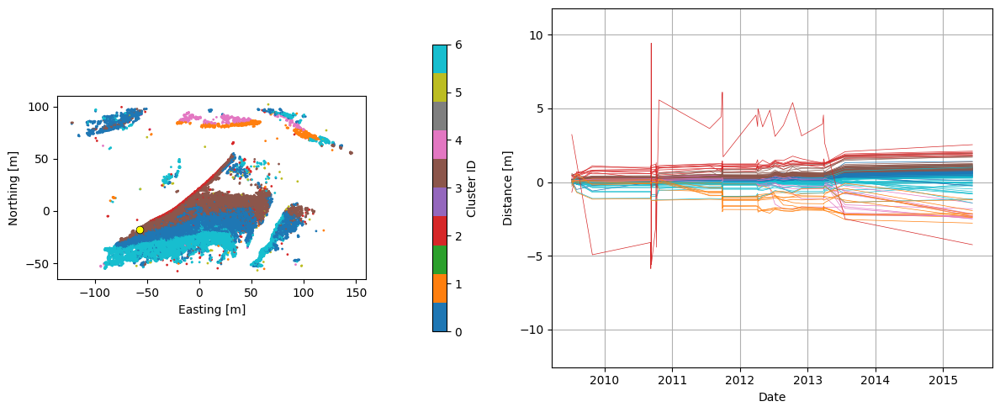

In [ ]:
# import kmeans clustering module from scikit-learn
from sklearn.cluster import KMeans

# use the smoothed distances for clustering
distances = analysis.distances

# define the number of clusters
k =7

# create an array to store the labels
labels = np.full((distances.shape[0]), np.nan)

nan_indicator = np.logical_not(np.isnan(np.sum(distances, axis=1)))
kmeans = KMeans(n_clusters=k, random_state=0).fit(distances[nan_indicator, :])
labels[nan_indicator] = kmeans.labels_

# create the figure
fig = plt.figure(figsize=(12, 5))
ax1 = fig.add_subplot(1, 2, 1)  # Removed projection='3d' to make it 2D
ax2 = fig.add_subplot(1, 2, 2)

# set colormap for clustering
cmap_clustering = 'tab10'

# get the corepoints
corepoints = analysis.corepoints.cloud

# plot the scene colored by cluster labels in 2D
d = ax1.scatter(corepoints[:, 0], corepoints[:, 1], c=labels, cmap=cmap_clustering, s=1)

ticks = np.arange(0, k, 1).astype(int)
cb = plt.colorbar(d, ticks=ticks, label='Cluster ID', ax=ax1, shrink=.8, pad=.15)

ax1.set_xlabel('Easting [m]')
ax1.set_ylabel('Northing [m]')
ax1.set_aspect('equal')  # keep equal aspect ratio

# plot the time series colored by cluster labels
import matplotlib as mpl
cmap_labels = labels / np.nanmax(labels)
cmap_clusters = mpl.cm.get_cmap(cmap_clustering)
labels_plotted = {}

# use only every 100th time series for plotting
for c in range(0, distances.shape[0], 100):
    ts = distances[c]
    label_curr = labels[c]
    if label_curr not in labels_plotted:
        labels_plotted[label_curr] = [c]
    p1 = ax2.plot(timestamps[:len(ts)], ts, c=cmap_clusters(cmap_labels[c]), label=label_curr, linewidth=.5)
    labels_plotted[label_curr].append(c)

# Highlight selected corepoint
ax1.scatter(coord_sel[0], coord_sel[1],
            c='yellow', s=40, edgecolor='black', linewidth=0.5,
            label='Selected location')
ax2.set_xlabel('Date')
ax2.set_ylabel('Distance [m]')
ax2.grid()

plt.tight_layout()
plt.show()


In [ ]:
from py4dgeo.segmentation import RegionGrowingSeed

class LinearChangeSeeds(py4dgeo.RegionGrowingAlgorithm):
    def find_seedpoints(self):

        # The list of generated seeds
        seeds = []

        # General seed criteria minimum magnitude and minimum timespan
        min_magn = self.height_threshold
        minperiod = self.minperiod
        maxperiod = 12

        # The list of core point indices to check as seeds
        if self.seed_candidates is None:
            # Use all corepoints if no selection specified, considering subsampling
            seed_candidates_curr = range(
                0, self.analysis.distances_for_compute.shape[0], self.seed_subsampling
                )
        else:
            # Use the specified corepoint indices, but consider subsampling
            seed_candidates_curr = self.seed_candidates[::self.seed_subsampling]

        # Interpolate nans in time series
        def interp_nan(data):
            bad_indexes = np.isnan(data)
            num_nans = len(np.argwhere(bad_indexes))
            num_not_nans = len(data) - num_nans
            if num_not_nans > 3:
                if num_nans > 0:
                    good_indexes = np.logical_not(bad_indexes)
                    good_data = data[good_indexes]
                    interpolated = np.interp(bad_indexes.nonzero()[0], good_indexes.nonzero()[0], good_data)
                    data[bad_indexes] = interpolated
            return data, num_nans, num_not_nans

        # Iterate over all time series to analyse their change points
        for cp_idx in seed_candidates_curr:

            timeseries = self.analysis.distances_for_compute[cp_idx, :]

            ts1d_interp, num_nans, num_not_nans = interp_nan(timeseries)
            if num_not_nans <= 3:
                continue

            # Use segment-wise linear regression to find change timespans
            from sklearn.tree import DecisionTreeRegressor
            from sklearn.linear_model import LinearRegression
            num_epochs = len(timeseries)
            xs = np.arange(0, num_epochs, dtype=float)

            dys = np.gradient(ts1d_interp, xs)

            rgr = DecisionTreeRegressor(max_depth=4) # depth controls the number of segments (sensitivity)
            rgr.fit(xs.reshape(-1, 1), dys.reshape(-1, 1))
            dys_dt = rgr.predict(xs.reshape(-1, 1)).flatten()

            ys_sl = np.ones(len(xs)) * np.nan
            for y in np.unique(dys_dt):

                msk = dys_dt == y
                lin_reg = LinearRegression()
                lin_reg.fit(xs[msk].reshape(-1, 1), ts1d_interp[msk].reshape(-1, 1))
                ys_sl[msk] = lin_reg.predict(xs[msk].reshape(-1, 1)).flatten()
                x_vertices = [xs[msk][0], xs[msk][-1]]
                startn_det = int(round(x_vertices[0], 0))
                stopn_det = int(round(x_vertices[-1], 0))
                startp = np.max([startn_det - 1, 0])
                stopp = np.min([stopn_det + 1, len(timeseries) - 1])
                if (startp == 0) and stopp >= (len(timeseries) - 1):
                    continue

                # check minimum and maximum period criterion
                per = stopp - startp
                if (per < minperiod) or (per > maxperiod):
                    continue
                # check minimum magnitude criterion
                elif abs(np.max(timeseries[startp:stopp + 1]) - (np.min(timeseries[startp:stopp + 1]))) < min_magn:
                    continue
                # add seed
                else:
                    # construct the RegionGrowingSeed object consisting of index, start_epoch, end_epoch
                    curr_seed = RegionGrowingSeed(cp_idx, startp, stopp)
                    seeds.append(curr_seed)

        return seeds

In [ ]:
# Cell X: Further split only the missing 3rd chunk

# 0) Mount Drive (if not already done)
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import os, pickle, math

# 1) Paths & constants
save_dir       = "/content/drive/MyDrive/4D_OBC_results/chunks"
os.makedirs(save_dir, exist_ok=True)

TOTAL_SEEDS    = 950_772
ORIG_CHUNKS    = 3
orig_chunk_sz  = math.ceil(TOTAL_SEEDS / ORIG_CHUNKS)

# The index (0‑based) of the chunk you want to subdivide:
TARGET_CHUNK_I = 2

# Define its global start/stop
chunk_start = TARGET_CHUNK_I * orig_chunk_sz
chunk_stop  = min(chunk_start + orig_chunk_sz, TOTAL_SEEDS)

# Your finer subdivide size for this last chunk:
SUB_BATCH_SIZE = 30_000
n_sub         = math.ceil((chunk_stop - chunk_start) / SUB_BATCH_SIZE)

# 2) Instantiate your algo once
algo = LinearChangeSeeds(
    neighborhood_radius=1.0,
    min_segments=50,
    minperiod=2,
    height_threshold=0.1,
    thresholds=[0.5,0.6,0.7,0.8,0.9],
)

# 3) Loop over sub‑batches within the last chunk
for j in range(n_sub):
    sub_start = chunk_start + j * SUB_BATCH_SIZE
    sub_stop  = min(sub_start + SUB_BATCH_SIZE, chunk_stop)
    fname     = f"chunk_{TARGET_CHUNK_I:02d}_" \
                f"{sub_start:06d}_{sub_stop-1:06d}.pkl"
    fpath     = os.path.join(save_dir, fname)

    # Skip any sub‑batch already done
    if os.path.exists(fpath):
        print(f"Sub‑batch {j} ({sub_start}–{sub_stop-1}) exists, skipping.")
        continue

    print(f"\nRunning sub‑batch {j}: seeds {sub_start} to {sub_stop-1}…")

    # Restrict algorithm to this seed range
    algo.resume_from_seed = sub_start
    algo.stop_at_seed     = sub_stop

    # Clear previous results & run
    analysis.invalidate_results(seeds=True, objects=True, smoothed_distances=False)
    sub_objs = algo.run(analysis)
    print(f"  Produced {len(sub_objs)} objects")

    # Save sub‑batch
    with open(fpath, "wb") as f:
        pickle.dump(sub_objs, f)
    print(f"Saved sub‑batch {j} to {fpath}")

print("\nAll sub‑batches for chunk 2 processed (or already present).")


Mounted at /content/drive
Sub‑batch 0 (633848–663847) exists, skipping.
Sub‑batch 1 (663848–693847) exists, skipping.
Sub‑batch 2 (693848–723847) exists, skipping.
Sub‑batch 3 (723848–753847) exists, skipping.
Sub‑batch 4 (753848–783847) exists, skipping.
Sub‑batch 5 (783848–813847) exists, skipping.
Sub‑batch 6 (813848–843847) exists, skipping.
Sub‑batch 7 (843848–873847) exists, skipping.
Sub‑batch 8 (873848–903847) exists, skipping.
Sub‑batch 9 (903848–933847) exists, skipping.
Sub‑batch 10 (933848–950771) exists, skipping.

All sub‑batches for chunk 2 processed (or already present).


In [ ]:
# Step 1: Load all segment chunks/sub-batches from Drive into all_objects

from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import os
import pickle

# Path to your chunk directory
chunk_dir = "/content/drive/MyDrive/4D_OBC_results/chunks"
assert os.path.exists(chunk_dir), "Chunk folder not found!"

# Load all .pkl files
all_objects = []
chunk_files = sorted(f for f in os.listdir(chunk_dir) if f.endswith(".pkl"))

print(f"🔍 Found {len(chunk_files)} files to load")

for i, fname in enumerate(chunk_files, 1):
    path = os.path.join(chunk_dir, fname)
    with open(path, "rb") as f:
        objs = pickle.load(f)
    all_objects.extend(objs)
    print(f"[{i}/{len(chunk_files)}] Loaded: {fname} → {len(objs)} objects")

print(f"\nTotal segment objects loaded: {len(all_objects)}")


Mounted at /content/drive
🔍 Found 13 files to load
[1/13] Loaded: chunk_00_000000_316923.pkl → 728 objects
[2/13] Loaded: chunk_01_316924_633847.pkl → 1967 objects
[3/13] Loaded: chunk_02_633848_663847.pkl → 1484 objects
[4/13] Loaded: chunk_02_663848_693847.pkl → 1621 objects
[5/13] Loaded: chunk_02_693848_723847.pkl → 1647 objects
[6/13] Loaded: chunk_02_723848_753847.pkl → 1738 objects
[7/13] Loaded: chunk_02_753848_783847.pkl → 1710 objects
[8/13] Loaded: chunk_02_783848_813847.pkl → 1653 objects
[9/13] Loaded: chunk_02_813848_843847.pkl → 1434 objects
[10/13] Loaded: chunk_02_843848_873847.pkl → 1325 objects
[11/13] Loaded: chunk_02_873848_903847.pkl → 918 objects
[12/13] Loaded: chunk_02_903848_933847.pkl → 548 objects
[13/13] Loaded: chunk_02_933848_950771.pkl → 134 objects

Total segment objects loaded: 16907


Segments retained for visualization: 11936


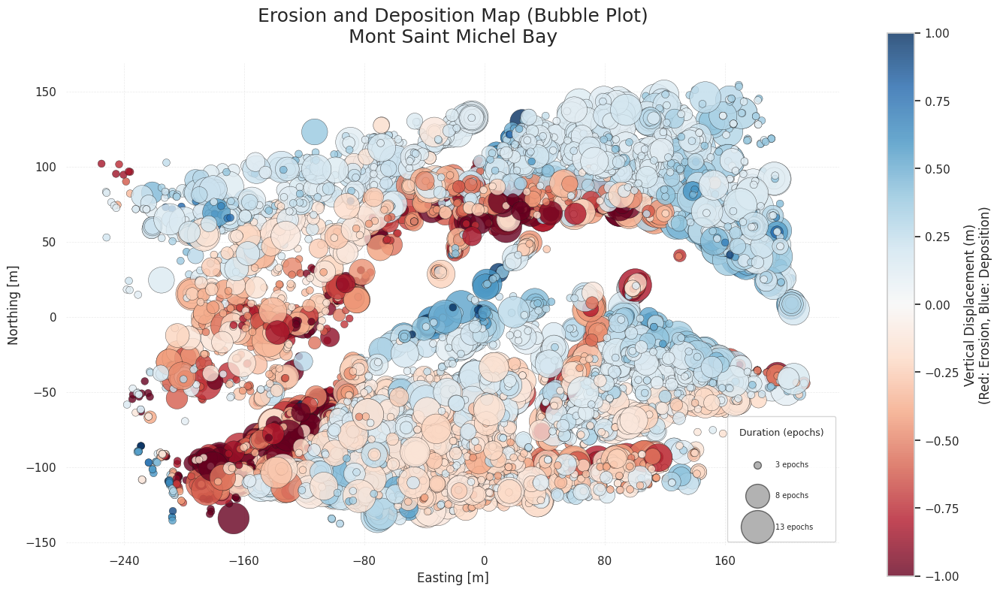

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import seaborn as sns
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.lines as mlines
from shapely.geometry import Point

# Styling
sns.set(style="whitegrid")

# --- Configuration ---
resolution = 0.5  # meters per point
points_xy = analysis.corepoints.cloud[:, :2]
distances = analysis.distances  # shape: (n_corepoints, n_epochs)

records = []

# --- Segment data processing ---
for seg in all_objects:
    start, end = seg.start_epoch, seg.end_epoch
    duration_epochs = end - start + 1
    indices = seg.indices

    segment_ts = distances[indices, start:end+1]
    if np.isnan(segment_ts).all():
        continue

    mean_per_point = np.nanmean(segment_ts, axis=1)
    magnitude = np.nanmean(mean_per_point)

    coords = points_xy[indices]

    # Use mean coordinate as point location for bubble
    centroid = coords.mean(axis=0)
    geometry = Point(centroid)

    records.append({
        "duration": duration_epochs,
        "magnitude": magnitude,
        "geometry": geometry
    })

# --- Create GeoDataFrame ---
gdf_segments = gpd.GeoDataFrame(records, crs="EPSG:2154")

# --- Clean filtering ---
gdf_segments["duration"] = gdf_segments["duration"].astype(int)
gdf_segments["magnitude"] = gdf_segments["magnitude"].astype(float)

gdf_viz = gdf_segments[
    (gdf_segments["magnitude"].abs() > 0.1) &
    (gdf_segments["duration"] >= 3)
]

print(f"Segments retained for visualization: {len(gdf_viz)}")

# --- Normalize duration to bubble size range ---
min_size, max_size = 50, 1000  # adjust as needed for scatter sizes
dur_min, dur_max = gdf_viz["duration"].min(), gdf_viz["duration"].max()
gdf_viz["size"] = min_size + (gdf_viz["duration"] - dur_min) / (dur_max - dur_min) * (max_size - min_size)

# --- Plotting ---
fig, ax = plt.subplots(figsize=(14, 10))

# Scatter plot: size by duration, color by magnitude
sc = ax.scatter(
    gdf_viz.geometry.x, gdf_viz.geometry.y,
    s=gdf_viz["size"],
    c=gdf_viz["magnitude"],
    cmap="RdBu",
    norm=colors.Normalize(vmin=-1.0, vmax=1.0),
    alpha=0.8,
    edgecolor='k',
    linewidth=0.3
)

# --- Colorbar ---
cbar = plt.colorbar(sc, ax=ax, shrink=0.75, orientation="vertical")
cbar.set_label("Vertical Displacement (m)\n(Red: Erosion, Blue: Deposition)", fontsize=12)

# --- Duration size legend ---
for_leg = []
for d in [dur_min, (dur_min + dur_max) // 2, dur_max]:
    size = min_size + (d - dur_min) / (dur_max - dur_min) * (max_size - min_size)
    # Create a scatter point for legend with given size
    for_leg.append(plt.scatter([], [], s=size, color='gray', edgecolor='k', alpha=0.6, label=f"{int(d)} epochs"))

ax.legend(handles=for_leg, title="Duration (epochs)", loc="lower right", fontsize=7, title_fontsize=9,  labelspacing=3.2 , borderpad=1.6, handletextpad=1.5)

# --- Map Formatting ---
ax.set_title("Erosion and Deposition Map (Bubble Plot)\nMont Saint Michel Bay", fontsize=18, pad=20)
ax.set_xlabel("Easting [m]", fontsize=12)
ax.set_ylabel("Northing [m]", fontsize=12)
ax.set_aspect("equal")
ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.4)
ax.xaxis.set_major_locator(mticker.MaxNLocator(8))
ax.yaxis.set_major_locator(mticker.MaxNLocator(8))

# Remove borders
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.show()


Segments retained for visualization: 11936


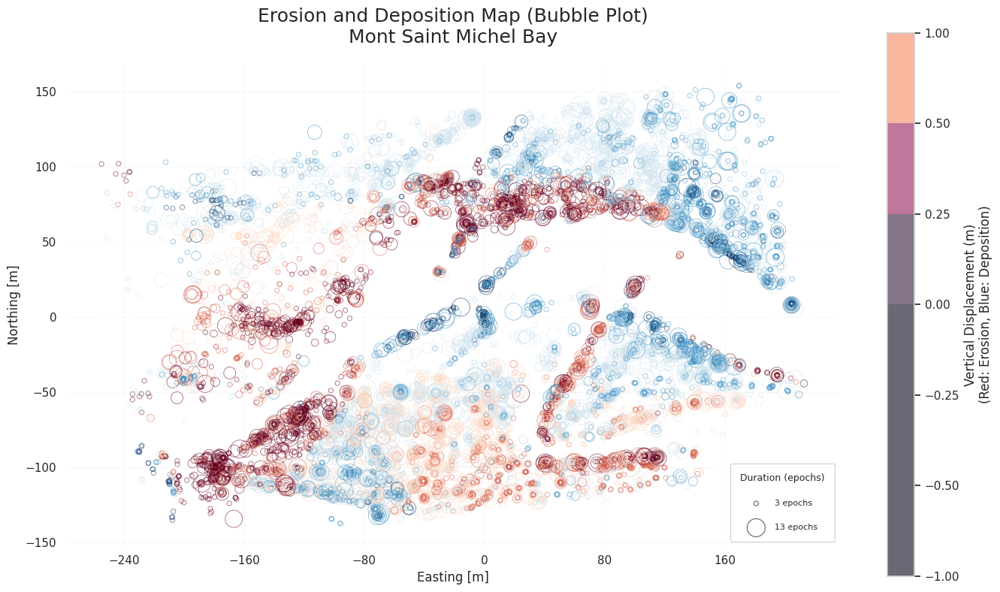

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import seaborn as sns
import matplotlib.colors as colors
from shapely.geometry import Point

# Styling
sns.set(style="whitegrid")

# --- Configuration ---
resolution = 0.5  # meters per point
points_xy = analysis.corepoints.cloud[:, :2]
distances = analysis.distances  # shape: (n_corepoints, n_epochs)

records = []

# --- Segment data processing ---
for seg in all_objects:
    start, end = seg.start_epoch, seg.end_epoch
    duration_epochs = end - start + 1
    indices = seg.indices

    segment_ts = distances[indices, start:end+1]
    if np.isnan(segment_ts).all():
        continue

    mean_per_point = np.nanmean(segment_ts, axis=1)
    magnitude = np.nanmean(mean_per_point)

    coords = points_xy[indices]
    centroid = coords.mean(axis=0)
    geometry = Point(centroid)

    records.append({
        "duration": duration_epochs,
        "magnitude": magnitude,
        "geometry": geometry
    })

# --- Create GeoDataFrame ---
gdf_segments = gpd.GeoDataFrame(records, crs="EPSG:2154")

# --- Clean filtering ---
gdf_segments["duration"] = gdf_segments["duration"].astype(int)
gdf_segments["magnitude"] = gdf_segments["magnitude"].astype(float)

gdf_viz = gdf_segments[
    (gdf_segments["magnitude"].abs() > 0.1) &
    (gdf_segments["duration"] >= 3)
]

print(f"Segments retained for visualization: {len(gdf_viz)}")

# --- Normalize duration to bubble size range (smaller bubbles) ---
min_size, max_size = 20, 300
dur_min, dur_max = gdf_viz["duration"].min(), gdf_viz["duration"].max()
gdf_viz["size"] = min_size + (gdf_viz["duration"] - dur_min) / (dur_max - dur_min) * (max_size - min_size)

# --- Discrete color bins for clarity ---
bounds = [-1.0, -0.5, -0.25, 0.0, 0.25, 0.5, 1.0]
norm = colors.BoundaryNorm(bounds, ncolors=256)

# --- Add slight jitter to reduce overplotting ---
np.random.seed(42)  # reproducible
jitter = np.random.uniform(-0.5, 0.5, size=(len(gdf_viz), 2))
x_jittered = gdf_viz.geometry.x + jitter[:, 0]
y_jittered = gdf_viz.geometry.y + jitter[:, 1]

# --- Plotting ---
fig, ax = plt.subplots(figsize=(14, 10))

# Hollow circles with discrete color bins
sc = ax.scatter(
    x_jittered,
    y_jittered,
    s=gdf_viz["size"],
    facecolors="none",
    edgecolors=plt.cm.RdBu(norm(gdf_viz["magnitude"])),
    linewidth=0.6,
    alpha=0.6
)

# --- Colorbar with discrete ticks ---
cbar = plt.colorbar(sc, ax=ax, boundaries=bounds, ticks=bounds, shrink=0.75)
cbar.set_label("Vertical Displacement (m)\n(Red: Erosion, Blue: Deposition)", fontsize=12)

# --- Simpler duration size legend (min and max only) ---
for_leg = []
for d in [dur_min, dur_max]:
    size = min_size + (d - dur_min) / (dur_max - dur_min) * (max_size - min_size)
    for_leg.append(
        plt.scatter([], [], s=size, facecolors="none", edgecolors="gray", label=f"{int(d)} epochs")
    )

ax.legend(
    handles=for_leg,
    title="Duration (epochs)",
    loc="lower right",
    fontsize=8,
    title_fontsize=9,
    labelspacing=2.0,
    borderpad=1.2,
    handletextpad=1.2
)

# --- Map Formatting ---
ax.set_title("Erosion and Deposition Map (Bubble Plot)\nMont Saint Michel Bay", fontsize=18, pad=20)
ax.set_xlabel("Easting [m]", fontsize=12)
ax.set_ylabel("Northing [m]", fontsize=12)
ax.set_aspect("equal")
ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.3)
ax.xaxis.set_major_locator(mticker.MaxNLocator(8))
ax.yaxis.set_major_locator(mticker.MaxNLocator(8))

# Remove borders
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.show()


Segments retained for visualization: 11936


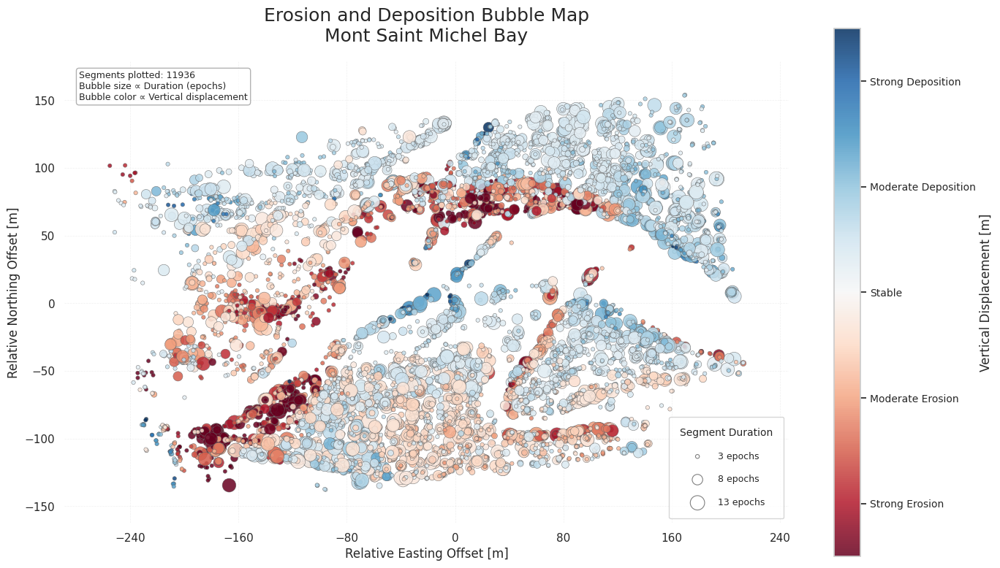

Saved PNG to /content/erosion_deposition_map.png
Saved PDF to /content/erosion_deposition_map.pdf


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import seaborn as sns
from shapely.geometry import Point
from matplotlib import colors

# Styling
sns.set(style="whitegrid")

# --- Configuration ---
resolution = 0.5  # meters per point
points_xy = analysis.corepoints.cloud[:, :2]
distances = analysis.distances  # shape: (n_corepoints, n_epochs)

records = []

# --- Segment data processing ---
for seg in all_objects:
    start, end = seg.start_epoch, seg.end_epoch
    duration_epochs = end - start + 1
    indices = seg.indices

    segment_ts = distances[indices, start:end + 1]
    if np.isnan(segment_ts).all():
        continue

    mean_per_point = np.nanmean(segment_ts, axis=1)
    magnitude = np.nanmean(mean_per_point)

    coords = points_xy[indices]
    centroid = coords.mean(axis=0)
    geometry = Point(centroid)

    records.append({
        "duration": duration_epochs,
        "magnitude": magnitude,
        "geometry": geometry
    })

# --- Create GeoDataFrame ---
gdf_segments = gpd.GeoDataFrame(records, crs="EPSG:2154")

# --- Clean filtering ---
gdf_segments["duration"] = gdf_segments["duration"].astype(int)
gdf_segments["magnitude"] = gdf_segments["magnitude"].astype(float)

gdf_viz = gdf_segments[
    (gdf_segments["magnitude"].abs() > 0.1) &
    (gdf_segments["duration"] >= 3)
]

print(f"Segments retained for visualization: {len(gdf_viz)}")

# --- Normalize duration to bubble size range ---
min_size, max_size = 15, 200
dur_min, dur_max = gdf_viz["duration"].min(), gdf_viz["duration"].max()
gdf_viz["size"] = min_size + (gdf_viz["duration"] - dur_min) / (dur_max - dur_min) * (max_size - min_size)

# --- Colormap and normalization ---
cmap = plt.cm.RdBu
norm = colors.Normalize(vmin=-1.0, vmax=1.0)

# --- Jitter to reduce overlapping ---
np.random.seed(42)
jitter = np.random.uniform(-0.5, 0.5, size=(len(gdf_viz), 2))
x_jittered = gdf_viz.geometry.x + jitter[:, 0]
y_jittered = gdf_viz.geometry.y + jitter[:, 1]

# --- Plotting ---
fig, ax = plt.subplots(figsize=(14, 10))

sc = ax.scatter(
    x_jittered,
    y_jittered,
    s=gdf_viz["size"],
    c=gdf_viz["magnitude"],
    cmap=cmap,
    norm=norm,
    edgecolors="#666666",  # softer gray edges
    linewidth=0.4,         # thinner edges
    alpha=0.85
)

# --- Colorbar with categories ---
cbar = plt.colorbar(sc, ax=ax, shrink=0.75)
cbar.set_label("Vertical Displacement [m]", fontsize=12)
cbar.ax.tick_params(labelsize=10)
cbar.set_ticks([-0.8, -0.4, 0.0, 0.4, 0.8])
cbar.set_ticklabels([
    "Strong Erosion",
    "Moderate Erosion",
    "Stable",
    "Moderate Deposition",
    "Strong Deposition"
])

# --- Segment duration legend ---
for_leg = []
for d in [dur_min, (dur_min + dur_max) // 2, dur_max]:
    size = min_size + (d - dur_min) / (dur_max - dur_min) * (max_size - min_size)
    for_leg.append(
        plt.scatter([], [], s=size, facecolors="none", edgecolors="gray", linewidth=0.8, label=f"{int(d)} epochs")
    )

ax.legend(
    handles=for_leg,
    title="Segment Duration",
    loc="lower right",
    fontsize=9,
    title_fontsize=10,
    labelspacing=1.5,
    borderpad=1.2,
    handletextpad=1.2
)

# --- Title and Labels ---
ax.set_title(
    "Erosion and Deposition Bubble Map\nMont Saint Michel Bay",
    fontsize=18, pad=20
)
ax.set_xlabel("Relative Easting Offset [m]", fontsize=12)
ax.set_ylabel("Relative Northing Offset [m]", fontsize=12)

# --- Grid and Ticks ---
ax.set_aspect("equal")
ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.3)
ax.xaxis.set_major_locator(mticker.MaxNLocator(8))
ax.yaxis.set_major_locator(mticker.MaxNLocator(8))

# --- Expand limits slightly ---
xlim = ax.get_xlim()
ylim = ax.get_ylim()
ax.set_xlim(xlim[0] - 10, xlim[1] + 10)
ax.set_ylim(ylim[0] - 10, ylim[1] + 10)

# --- Remove borders ---
for spine in ax.spines.values():
    spine.set_visible(False)

# --- Annotation box (consistent wording) ---
textstr = (
    f"Segments plotted: {len(gdf_viz)}\n"
    "Bubble size ∝ Duration (epochs)\n"
    "Bubble color ∝ Vertical displacement"
)
props = dict(boxstyle="round,pad=0.3", facecolor="white", edgecolor="gray", alpha=0.6)
ax.text(
    0.02, 0.98,
    textstr,
    transform=ax.transAxes,
    fontsize=9,
    verticalalignment="top",
    bbox=props
)

# --- Save plot before showing ---
output_png = "/content/erosion_deposition_map.png"
output_pdf = "/content/erosion_deposition_map.pdf"

plt.tight_layout()
plt.savefig(output_png, dpi=300, bbox_inches="tight", transparent=True)  # transparent PNG
plt.savefig(output_pdf, bbox_inches="tight")                             # PDF version
plt.show()

print(f"Saved PNG to {output_png}")
print(f"Saved PDF to {output_pdf}")



=== Erosion vs Deposition Summary ===
                                Metric Erosion (red) Deposition (blue)
                    Number of segments          5615              6321
                   Total magnitude [m]      2760.274          1621.168
Duration-weighted magnitude [m·epochs]     11604.290          6810.319
                           Net balance     -1139.106                  


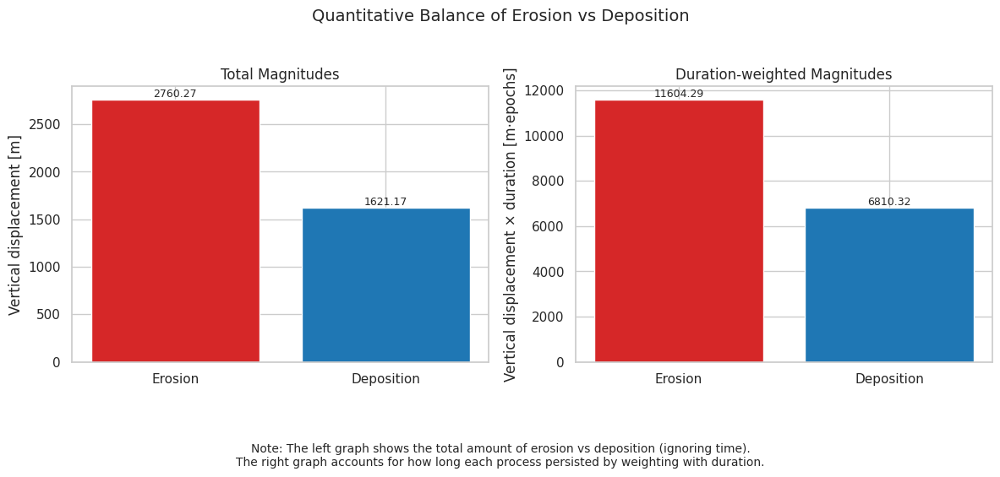

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Quantitative analysis ---
erosion = gdf_viz[gdf_viz["magnitude"] < 0]
deposition = gdf_viz[gdf_viz["magnitude"] > 0]

# Raw counts
erosion_count = len(erosion)
deposition_count = len(deposition)

# Totals (absolute for erosion)
total_erosion = erosion["magnitude"].abs().sum()
total_deposition = deposition["magnitude"].sum()

# Weighted totals (by duration)
erosion_weighted = (erosion["magnitude"].abs() * erosion["duration"]).sum()
deposition_weighted = (deposition["magnitude"] * deposition["duration"]).sum()

# Net balances
net_raw = total_deposition - total_erosion
net_weighted = deposition_weighted - erosion_weighted

# --- Build results table ---
results = pd.DataFrame({
    "Metric": [
        "Number of segments",
        "Total magnitude [m]",
        "Duration-weighted magnitude [m·epochs]",
        "Net balance"
    ],
    "Erosion (red)": [
        erosion_count,
        f"{total_erosion:.3f}",
        f"{erosion_weighted:.3f}",
        f"-{abs(net_raw):.3f}" if net_raw < 0 else ""
    ],
    "Deposition (blue)": [
        deposition_count,
        f"{total_deposition:.3f}",
        f"{deposition_weighted:.3f}",
        f"{net_raw:.3f}" if net_raw > 0 else ""
    ]
})

print("\n=== Erosion vs Deposition Summary ===")
print(results.to_string(index=False))

# --- Graphs ---
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Raw magnitudes
bars1 = axes[0].bar(
    ["Erosion", "Deposition"],
    [total_erosion, total_deposition],
    color=["#d62728", "#1f77b4"]  # red, blue
)
axes[0].set_title("Total Magnitudes")
axes[0].set_ylabel("Vertical displacement [m]")

# Add labels
for bar in bars1:
    height = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width()/2, height,
                 f"{height:.2f}", ha="center", va="bottom", fontsize=9)

# Weighted magnitudes
bars2 = axes[1].bar(
    ["Erosion", "Deposition"],
    [erosion_weighted, deposition_weighted],
    color=["#d62728", "#1f77b4"]  # red, blue
)
axes[1].set_title("Duration-weighted Magnitudes")
axes[1].set_ylabel("Vertical displacement × duration [m·epochs]")

# Add labels
for bar in bars2:
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width()/2, height,
                 f"{height:.2f}", ha="center", va="bottom", fontsize=9)

# Add explanatory note below both graphs
fig.text(
    0.5, -0.05,
    "Note: The left graph shows the total amount of erosion vs deposition (ignoring time).\n"
    "The right graph accounts for how long each process persisted by weighting with duration.",
    ha="center", va="top", fontsize=10
)

# --- Save results table ---
results.to_csv("erosion_deposition_summary.csv", index=False)   # CSV
results.to_excel("erosion_deposition_summary.xlsx", index=False)  # Excel

# Optional: save as nicely formatted text file
with open("erosion_deposition_summary.txt", "w") as f:
    f.write(results.to_string(index=False))

# --- Layout ---
plt.suptitle("Quantitative Balance of Erosion vs Deposition", fontsize=14)
plt.tight_layout(rect=[0, 0.05, 1, 0.95])  # leave space for the note

# --- Save to PNG and PDF ---
fig.savefig("erosion_deposition_summary.png", dpi=300, bbox_inches="tight")
fig.savefig("erosion_deposition_summary.pdf", dpi=300, bbox_inches="tight")

# Show plot
plt.show()



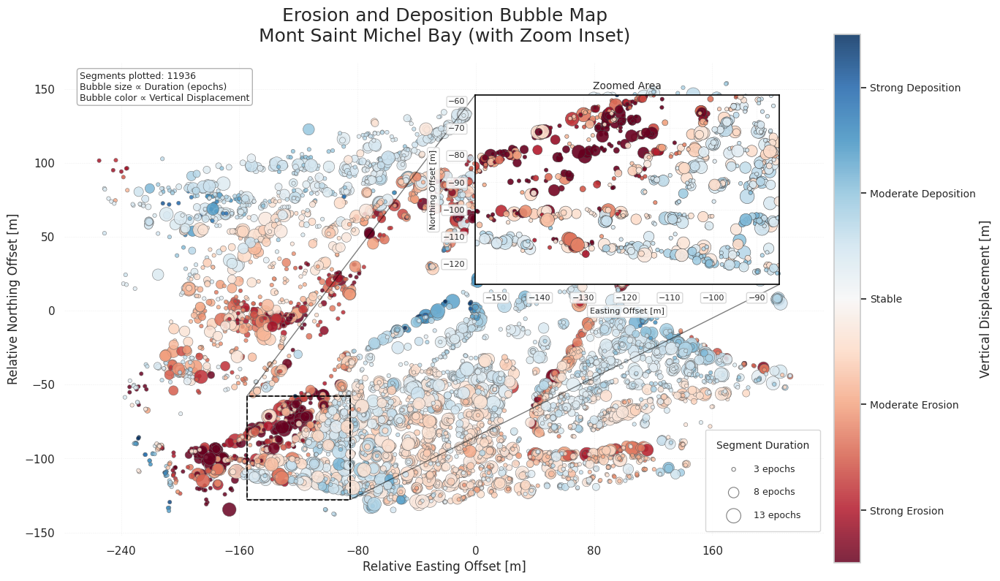

Saved PNG to /content/erosion_deposition_map_inset.png
Saved PDF to /content/erosion_deposition_map_inset.pdf


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.colors as mcolors
from matplotlib.patches import Rectangle

# --- Bubble size normalization ---
min_size, max_size = 15, 200
dur_min, dur_max = gdf_viz["duration"].min(), gdf_viz["duration"].max()
gdf_viz["size"] = min_size + (gdf_viz["duration"] - dur_min) / (dur_max - dur_min) * (max_size - min_size)

# --- Color mapping: Erosion (Red), Deposition (Blue) ---
cmap = plt.cm.RdBu
norm = mcolors.Normalize(vmin=-1.0, vmax=1.0)

# --- Jitter (to reduce point overlap) ---
np.random.seed(42)
jitter = np.random.uniform(-0.5, 0.5, size=(len(gdf_viz), 2))
x_jittered = gdf_viz.geometry.x + jitter[:, 0]
y_jittered = gdf_viz.geometry.y + jitter[:, 1]

# --- Inset bounds (manually refined) ---
inset_bounds = {
    "x_min": x_jittered.min() + 100,
    "x_max": x_jittered.min() + 170,
    "y_min": y_jittered.min() + 10,
    "y_max": y_jittered.min() + 80
}

# --- Plotting ---
fig, ax = plt.subplots(figsize=(14, 10))

# Main scatter plot
sc = ax.scatter(
    x_jittered,
    y_jittered,
    s=gdf_viz["size"],
    c=gdf_viz["magnitude"],
    cmap=cmap,
    norm=norm,
    edgecolors="#666666",
    linewidth=0.4,
    alpha=0.85
)

# --- Colorbar with categorical ticks ---
cbar = plt.colorbar(sc, ax=ax, shrink=0.75, pad=0.01)
cbar.set_label("Vertical Displacement [m]", fontsize=12)
cbar.ax.tick_params(labelsize=10)
cbar.set_ticks([-0.8, -0.4, 0.0, 0.4, 0.8])
cbar.set_ticklabels(["Strong Erosion", "Moderate Erosion", "Stable", "Moderate Deposition", "Strong Deposition"])

# --- Duration legend ---
for_leg = []
for d in [dur_min, (dur_min + dur_max) // 2, dur_max]:
    size = min_size + (d - dur_min) / (dur_max - dur_min) * (max_size - min_size)
    for_leg.append(
        plt.scatter([], [], s=size, facecolors="none", edgecolors="gray", linewidth=0.8, label=f"{int(d)} epochs")
    )

ax.legend(
    handles=for_leg,
    title="Segment Duration",
    loc="lower right",
    fontsize=9,
    title_fontsize=10,
    labelspacing=1.5,
    borderpad=1.2,
    handletextpad=1.2
)

# --- Main Title & Axis Labels ---
ax.set_title("Erosion and Deposition Bubble Map\nMont Saint Michel Bay (with Zoom Inset)", fontsize=18, pad=20)
ax.set_xlabel("Relative Easting Offset [m]", fontsize=12)
ax.set_ylabel("Relative Northing Offset [m]", fontsize=12)
ax.set_aspect("equal")
ax.grid(True, linestyle="--", linewidth=0.4, alpha=0.3)
ax.xaxis.set_major_locator(mticker.MaxNLocator(8))
ax.yaxis.set_major_locator(mticker.MaxNLocator(8))

# --- Inset rectangle on main map ---
rect = Rectangle(
    (inset_bounds["x_min"], inset_bounds["y_min"]),
    inset_bounds["x_max"] - inset_bounds["x_min"],
    inset_bounds["y_max"] - inset_bounds["y_min"],
    linewidth=1.2,
    edgecolor="black",
    facecolor="none",
    linestyle="--"
)
ax.add_patch(rect)

# --- Inset Axes ---
inset_ax = ax.inset_axes([0.54, 0.53, 0.4, 0.4])  # position in main figure
inset_ax.set_facecolor("white")  # white background

inset_mask = (
    (x_jittered >= inset_bounds["x_min"]) &
    (x_jittered <= inset_bounds["x_max"]) &
    (y_jittered >= inset_bounds["y_min"]) &
    (y_jittered <= inset_bounds["y_max"])
)

inset_ax.scatter(
    x_jittered[inset_mask],
    y_jittered[inset_mask],
    s=gdf_viz["size"][inset_mask],
    c=gdf_viz["magnitude"][inset_mask],
    cmap=cmap,
    norm=norm,
    edgecolors="#444444",
    linewidth=0.4,
    alpha=0.9
)

# --- Inset styling (readability) ---
inset_ax.set_xlim(inset_bounds["x_min"], inset_bounds["x_max"])
inset_ax.set_ylim(inset_bounds["y_min"], inset_bounds["y_max"])
inset_ax.set_title("Zoomed Area", fontsize=10, pad=6)

# axis labels for inset with rounded background & extra spacing
inset_ax.set_xlabel("Easting Offset [m]", fontsize=8, labelpad=6)
inset_ax.set_ylabel("Northing Offset [m]", fontsize=8, labelpad=6)

inset_ax.xaxis.label.set_bbox(dict(facecolor="white", edgecolor="lightgray", alpha=0.85, boxstyle="round,pad=0.3"))
inset_ax.yaxis.label.set_bbox(dict(facecolor="white", edgecolor="lightgray", alpha=0.85, boxstyle="round,pad=0.3"))

# tick labels with rounded background
for label in inset_ax.get_xticklabels() + inset_ax.get_yticklabels():
    label.set_fontsize(8)
    label.set_bbox(dict(facecolor="white", edgecolor="lightgray", alpha=0.85, boxstyle="round,pad=0.2"))

inset_ax.grid(True, linestyle="--", linewidth=0.4, alpha=0.3)

# --- Inset border (black frame) ---
for spine in inset_ax.spines.values():
    spine.set_edgecolor("black")
    spine.set_linewidth(1.2)

# --- Connector lines between main and inset ---
ax.indicate_inset_zoom(inset_ax, edgecolor="black")

# --- Clean borders (main plot only) ---
for spine in ax.spines.values():
    spine.set_visible(False)

# --- Annotation Box ---
textstr = f"Segments plotted: {len(gdf_viz)}\nBubble size ∝ Duration (epochs)\nBubble color ∝ Vertical Displacement"
props = dict(boxstyle="round,pad=0.3", facecolor="white", edgecolor="gray", alpha=0.6)
ax.text(
    0.02, 0.98,
    textstr,
    transform=ax.transAxes,
    fontsize=9,
    verticalalignment="top",
    bbox=props
)

# --- Save outputs ---
output_png = "/content/erosion_deposition_map_inset.png"
output_pdf = "/content/erosion_deposition_map_inset.pdf"

plt.tight_layout()
plt.savefig(output_png, dpi=300, bbox_inches="tight", transparent=True)
plt.savefig(output_pdf, bbox_inches="tight")
plt.show()

print(f"Saved PNG to {output_png}")
print(f"Saved PDF to {output_pdf}")


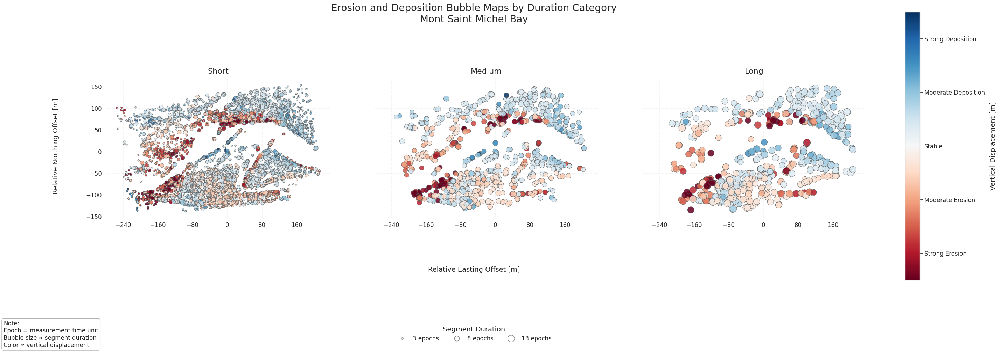

Saved PNG to /content/erosion_deposition_multi_panel.png
Saved PDF to /content/erosion_deposition_multi_panel.pdf


In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.colors as mcolors
import numpy as np
import pandas as pd

# --- Set global style ---
mpl.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': 'DejaVu Sans',
    'axes.titlesize': 16,
    'axes.labelsize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'legend.title_fontsize': 14,
    'figure.titlesize': 20,
    'axes.linewidth': 1.0,
    'grid.linewidth': 0.5,
})

# --- Dynamic binning for duration_category ---
dur_min = gdf_viz['duration'].min()
dur_max = gdf_viz['duration'].max()
bins = [dur_min - 0.1, dur_min + (dur_max - dur_min)/3, dur_min + 2*(dur_max - dur_min)/3, dur_max + 0.1]
labels = ['Short', 'Medium', 'Long']
gdf_viz['duration_category'] = pd.cut(gdf_viz['duration'], bins=bins, labels=labels)

# --- Figure with 3 panels ---
fig, axes = plt.subplots(1, 3, figsize=(28, 12), sharex=True, sharey=True, constrained_layout=False)

# --- Plot each duration category ---
for ax, category in zip(axes, labels):
    subset = gdf_viz[gdf_viz['duration_category'] == category]
    if subset.empty:
        ax.text(0.5, 0.5, f"No data for {category}", ha='center', va='center', fontsize=16)
        ax.set_axis_off()
        continue

    # Jitter for overlapping points
    np.random.seed(42)
    jitter = np.random.uniform(-0.5, 0.5, size=(len(subset), 2))
    x_jittered = subset.geometry.x + jitter[:, 0]
    y_jittered = subset.geometry.y + jitter[:, 1]

    # Scatter plot (bubble map)
    sc = ax.scatter(
        x_jittered, y_jittered,
        s=subset["size"],
        c=subset["magnitude"],
        cmap=cmap,
        norm=norm,
        edgecolors="#555555",
        linewidth=0.6,
        alpha=0.85
    )

    # Axis formatting
    ax.set_title(category, pad=10)
    ax.set_aspect('equal')
    ax.grid(True, linestyle='--', alpha=0.3)
    ax.xaxis.set_major_locator(mticker.MaxNLocator(8))
    ax.yaxis.set_major_locator(mticker.MaxNLocator(8))
    for spine in ax.spines.values():
        spine.set_visible(False)

# --- Common axis labels and supertitle ---
fig.text(0.5, 0.2, "Relative Easting Offset [m]", ha='center', fontsize=14)
fig.text(0.07, 0.5, "Relative Northing Offset [m]", va='center', rotation='vertical', fontsize=14)
fig.suptitle(
    "Erosion and Deposition Bubble Maps by Duration Category\nMont Saint Michel Bay",
    y=0.84, fontsize=20
)

# --- Colorbar on the right ---
cbar_ax = fig.add_axes([0.94, 0.18, 0.015, 0.64])
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label("Vertical Displacement [m]", fontsize=14, labelpad=10)
cbar.ax.tick_params(labelsize=12)
cbar.set_ticks([-0.8, -0.4, 0.0, 0.4, 0.8])
cbar.set_ticklabels([
    "Strong Erosion", "Moderate Erosion", "Stable",
    "Moderate Deposition", "Strong Deposition"
])

# --- Duration legend (dynamic sizes based on actual data) ---
dur_unique = np.unique(gdf_viz['duration'])
dur_for_legend = np.linspace(dur_unique.min(), dur_unique.max(), 3)  # pick 3 representative durations
min_size = gdf_viz['size'].min()
max_size = gdf_viz['size'].max()

for_leg = []
for d in dur_for_legend:
    # Find closest actual segment size
    closest_idx = (gdf_viz['duration'] - d).abs().idxmin()
    size = gdf_viz.loc[closest_idx, 'size']
    for_leg.append(
        plt.Line2D([], [], marker='o', markersize=np.sqrt(size),
                   markerfacecolor='none', markeredgecolor='gray',
                   linewidth=0.8, linestyle='None', label=f"{int(d)} epochs")
    )

fig.legend(
    handles=for_leg, title="Segment Duration",
    loc='lower center', bbox_to_anchor=(0.5, 0.02),
    ncol=3, frameon=False
)

# --- Annotation box ---
explanation_text = (
    "Note:\n"
    "Epoch = measurement time unit\n"
    "Bubble size ∝ segment duration\n"
    "Color ∝ vertical displacement"
)
props = dict(boxstyle="round,pad=0.3", facecolor="white", edgecolor="gray", alpha=0.6)
fig.text(0.02, 0.02, explanation_text, fontsize=12, bbox=props)

# --- Save files ---
output_png = "/content/erosion_deposition_multi_panel.png"
output_pdf = "/content/erosion_deposition_multi_panel.pdf"
plt.savefig(output_png, dpi=300, bbox_inches="tight", transparent=True)
plt.savefig(output_pdf, bbox_inches="tight")
plt.show()

print(f"Saved PNG to {output_png}")
print(f"Saved PDF to {output_pdf}")


In [ ]:
print(gdf_viz.columns)

print(gdf_viz['duration'].min(), gdf_viz['duration'].max())


Index(['duration', 'magnitude', 'geometry', 'size', 'duration_category'], dtype='object')
3 13


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

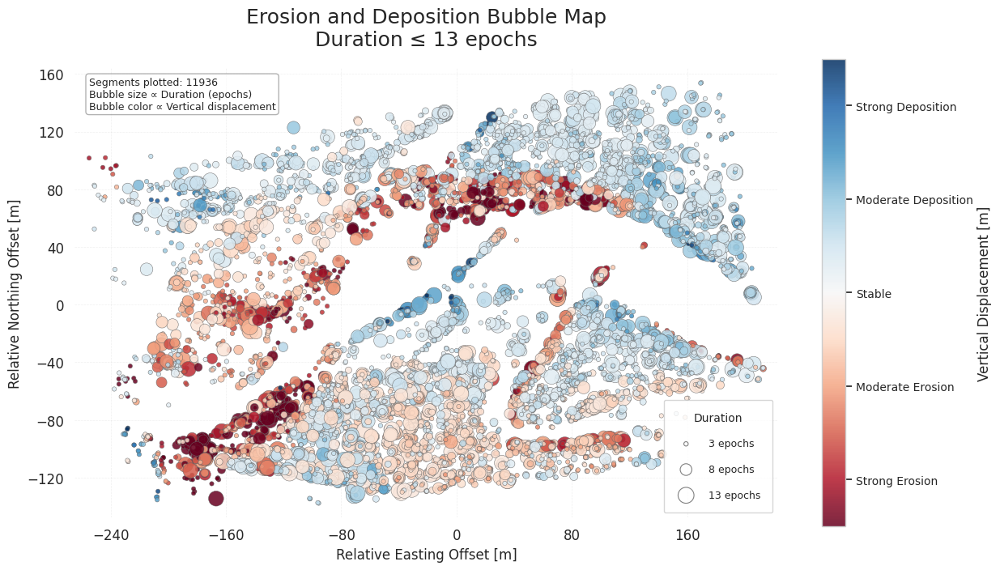

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from matplotlib import colors
from matplotlib.animation import FuncAnimation
from google.colab import files

# --- Parameters (consistent with main map) ---
min_size, max_size = 15, 200
dur_min, dur_max = gdf_viz["duration"].min(), gdf_viz["duration"].max()
cmap = plt.cm.RdBu
norm = colors.Normalize(vmin=-1.0, vmax=1.0)

def compute_sizes(duration):
    return min_size + (duration - dur_min) / (dur_max - dur_min) * (max_size - min_size)

def jitter_points(df):
    np.random.seed(42)
    jitter = np.random.uniform(-0.5, 0.5, size=(len(df), 2))
    x_jittered = df.geometry.x + jitter[:, 0]
    y_jittered = df.geometry.y + jitter[:, 1]
    return x_jittered, y_jittered

# --- Duration thresholds for animation ---
duration_thresholds = np.arange(dur_min, dur_max + 1, max(1, (dur_max - dur_min)//20))
if len(duration_thresholds) == 0:
    duration_thresholds = np.array([dur_min, dur_max])

# --- Figure setup ---
fig1, ax1 = plt.subplots(figsize=(14, 10))
sc1 = ax1.scatter([], [], s=[], c=[], cmap=cmap, norm=norm,
                  edgecolors="#666666", linewidth=0.4, alpha=0.85)

# --- Colorbar with categorical labels (consistent with main map) ---
cbar1 = plt.colorbar(sc1, ax=ax1, shrink=0.75)
cbar1.set_label("Vertical Displacement [m]", fontsize=12)
cbar1.ax.tick_params(labelsize=10)
cbar1.set_ticks([-0.8, -0.4, 0.0, 0.4, 0.8])
cbar1.set_ticklabels([
    "Strong Erosion",
    "Moderate Erosion",
    "Stable",
    "Moderate Deposition",
    "Strong Deposition"
])

# --- Bubble size legend (duration) ---
for_leg = []
for d in [dur_min, (dur_min + dur_max)//2, dur_max]:
    size = compute_sizes(d)
    for_leg.append(
        plt.scatter([], [], s=size, facecolors="none", edgecolors="gray",
                    linewidth=0.8, label=f"{int(d)} epochs")
    )

leg = ax1.legend(
    handles=for_leg,
    title="Duration",
    loc="lower right",
    fontsize=9,
    title_fontsize=10,
    labelspacing=1.5,
    borderpad=1.2,
    handletextpad=1.2
)

# --- Title & labels (consistent wording) ---
ax1.set_title(
    "Erosion and Deposition Bubble Map\nMont Saint Michel Bay",
    fontsize=18, pad=20
)
ax1.set_xlabel("Relative Easting Offset [m]", fontsize=12)
ax1.set_ylabel("Relative Northing Offset [m]", fontsize=12)

# --- Grid, ticks, limits ---
ax1.set_aspect("equal")
ax1.grid(True, linestyle="--", linewidth=0.5, alpha=0.3)
ax1.xaxis.set_major_locator(mticker.MaxNLocator(8))
ax1.yaxis.set_major_locator(mticker.MaxNLocator(8))
ax1.set_xlim(gdf_viz.geometry.x.min() - 10, gdf_viz.geometry.x.max() + 10)
ax1.set_ylim(gdf_viz.geometry.y.min() - 10, gdf_viz.geometry.y.max() + 10)

# --- Remove borders ---
for spine in ax1.spines.values():
    spine.set_visible(False)

# --- Annotation box (same as static map) ---
textstr = (
    f"Segments plotted: {len(gdf_viz)}\n"
    "Bubble size ∝ Duration (epochs)\n"
    "Bubble color ∝ Vertical displacement"
)
props = dict(boxstyle="round,pad=0.3", facecolor="white", edgecolor="gray", alpha=0.6)
ax1.text(
    0.02, 0.98,
    textstr,
    transform=ax1.transAxes,
    fontsize=9,
    verticalalignment="top",
    bbox=props
)

# --- Animation update ---
def update_duration(frame):
    thresh = duration_thresholds[frame]
    subset = gdf_viz[gdf_viz["duration"] <= thresh]
    if len(subset) == 0:
        sc1.set_offsets([])
        sc1.set_sizes([])
        sc1.set_array(np.array([]))
        ax1.set_title(
            f"Erosion and Deposition Bubble Map\nDuration ≤ {thresh} epochs (No data)",
            fontsize=18, pad=20
        )
        return sc1,
    x_j, y_j = jitter_points(subset)
    sizes = compute_sizes(subset["duration"])
    points = np.column_stack([x_j, y_j])
    sc1.set_offsets(points)
    sc1.set_sizes(sizes)
    sc1.set_array(subset["magnitude"])
    ax1.set_title(
        f"Erosion and Deposition Bubble Map\nDuration ≤ {thresh} epochs",
        fontsize=18, pad=20
    )
    return sc1,

# --- Build animation (slower for clarity) ---
ani_duration = FuncAnimation(
    fig1,
    update_duration,
    frames=len(duration_thresholds),
    blit=True,
    interval=1000,   # 1 sec per frame
    repeat=True
)

# --- Save as MP4 ---
ani_duration.save('animation_duration.mp4', writer='ffmpeg', fps=1)

# --- Download in Colab ---
files.download('animation_duration.mp4')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

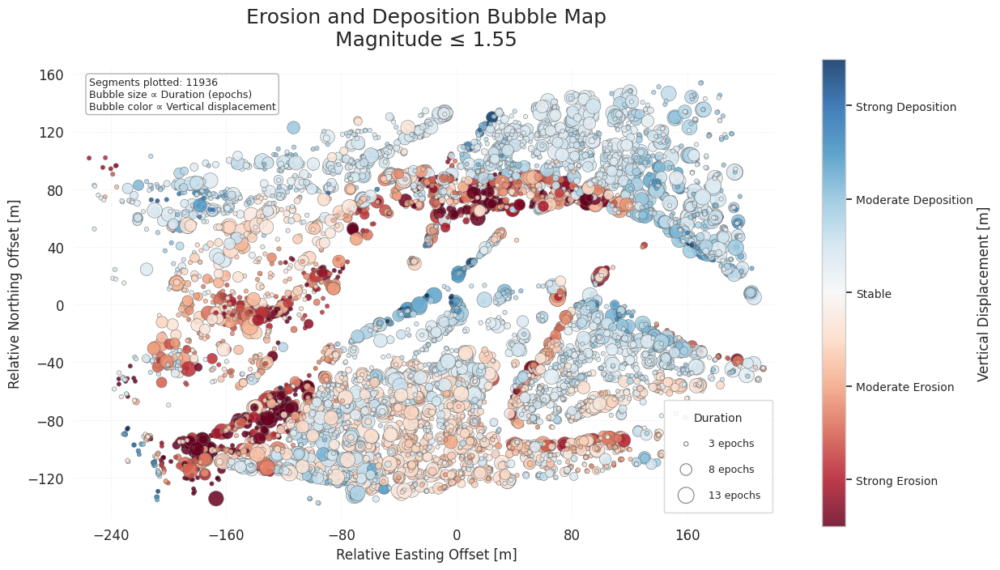

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from matplotlib import colors
from matplotlib.animation import FuncAnimation
from google.colab import files

# --- Parameters ---
min_size, max_size = 15, 200
dur_min, dur_max = gdf_viz["duration"].min(), gdf_viz["duration"].max()
mag_min, mag_max = gdf_viz["magnitude"].min(), gdf_viz["magnitude"].max()

cmap = plt.cm.RdBu
norm = colors.Normalize(vmin=-1.0, vmax=1.0)

def compute_sizes(duration):
    return min_size + (duration - dur_min) / (dur_max - dur_min) * (max_size - min_size)

def jitter_points(df):
    np.random.seed(42)
    jitter = np.random.uniform(-0.5, 0.5, size=(len(df), 2))
    x_jittered = df.geometry.x + jitter[:, 0]
    y_jittered = df.geometry.y + jitter[:, 1]
    return x_jittered, y_jittered

# --- Magnitude thresholds for animation ---
mag_bins = np.linspace(mag_min, mag_max, 20)

# --- Figure setup ---
fig2, ax2 = plt.subplots(figsize=(14, 10))
sc2 = ax2.scatter([], [], s=[], c=[], cmap=cmap, norm=norm,
                  edgecolors="#666666", linewidth=0.4, alpha=0.85)

# --- Colorbar with categorical labels ---
cbar2 = plt.colorbar(sc2, ax=ax2, shrink=0.75)
cbar2.set_label("Vertical Displacement [m]", fontsize=12)
cbar2.ax.tick_params(labelsize=10)
cbar2.set_ticks([-0.8, -0.4, 0.0, 0.4, 0.8])
cbar2.set_ticklabels([
    "Strong Erosion",
    "Moderate Erosion",
    "Stable",
    "Moderate Deposition",
    "Strong Deposition"
])

# --- Bubble size legend (duration) ---
for_leg = []
for d in [dur_min, (dur_min + dur_max)//2, dur_max]:
    size = compute_sizes(d)
    for_leg.append(
        plt.scatter([], [], s=size, facecolors="none", edgecolors="gray",
                    linewidth=0.8, label=f"{int(d)} epochs")
    )

ax2.legend(
    handles=for_leg,
    title="Duration",
    loc="lower right",
    fontsize=9,
    title_fontsize=10,
    labelspacing=1.5,
    borderpad=1.2,
    handletextpad=1.2
)

# --- Title & labels ---
ax2.set_title(
    "Erosion and Deposition Bubble Map\nMont Saint Michel Bay",
    fontsize=18, pad=20
)
ax2.set_xlabel("Relative Easting Offset [m]", fontsize=12)
ax2.set_ylabel("Relative Northing Offset [m]", fontsize=12)

# --- Grid, ticks, limits ---
ax2.set_aspect("equal")
ax2.grid(True, linestyle="--", linewidth=0.5, alpha=0.3)
ax2.xaxis.set_major_locator(mticker.MaxNLocator(8))
ax2.yaxis.set_major_locator(mticker.MaxNLocator(8))
ax2.set_xlim(gdf_viz.geometry.x.min() - 10, gdf_viz.geometry.x.max() + 10)
ax2.set_ylim(gdf_viz.geometry.y.min() - 10, gdf_viz.geometry.y.max() + 10)

# --- Remove borders ---
for spine in ax2.spines.values():
    spine.set_visible(False)

# --- Annotation box ---
textstr = (
    f"Segments plotted: {len(gdf_viz)}\n"
    "Bubble size ∝ Duration (epochs)\n"
    "Bubble color ∝ Vertical displacement"
)
props = dict(boxstyle="round,pad=0.3", facecolor="white", edgecolor="gray", alpha=0.6)
ax2.text(
    0.02, 0.98,
    textstr,
    transform=ax2.transAxes,
    fontsize=9,
    verticalalignment="top",
    bbox=props
)

# --- Animation update ---
def update_magnitude(frame):
    thresh = mag_bins[frame]
    subset = gdf_viz[gdf_viz["magnitude"] <= thresh]
    if len(subset) == 0:
        sc2.set_offsets([])
        sc2.set_sizes([])
        sc2.set_array(np.array([]))
        ax2.set_title(
            f"Erosion and Deposition Bubble Map\nMagnitude ≤ {thresh:.2f} (No data)",
            fontsize=18, pad=20
        )
        return sc2,
    x_j, y_j = jitter_points(subset)
    sizes = compute_sizes(subset["duration"])
    points = np.column_stack([x_j, y_j])
    sc2.set_offsets(points)
    sc2.set_sizes(sizes)
    sc2.set_array(subset["magnitude"])
    ax2.set_title(
        f"Erosion and Deposition Bubble Map\nMagnitude ≤ {thresh:.2f}",
        fontsize=18, pad=20
    )
    return sc2,

# --- Build animation (slower) ---
ani_magnitude = FuncAnimation(
    fig2,
    update_magnitude,
    frames=len(mag_bins),
    blit=True,
    interval=1000,   # 1 second per frame
    repeat=True
)

# --- Save as MP4 (slow fps for consistency) ---
ani_magnitude.save('animation_magnitude.mp4', writer='ffmpeg', fps=1)

# --- Download MP4 file in Colab ---
files.download('animation_magnitude.mp4')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

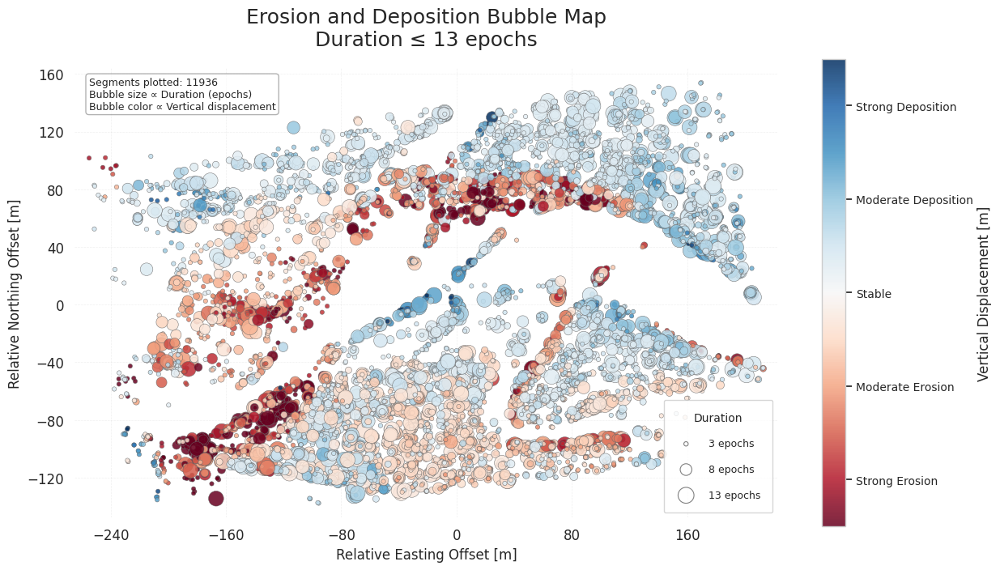

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from matplotlib import colors
from matplotlib.animation import FuncAnimation, PillowWriter
from google.colab import files

# --- Parameters ---
min_size, max_size = 15, 200
dur_min, dur_max = gdf_viz["duration"].min(), gdf_viz["duration"].max()
cmap = plt.cm.RdBu
norm = colors.Normalize(vmin=-1.0, vmax=1.0)

def compute_sizes(duration):
    return min_size + (duration - dur_min) / (dur_max - dur_min) * (max_size - min_size)

def jitter_points(df):
    np.random.seed(42)
    jitter = np.random.uniform(-0.5, 0.5, size=(len(df), 2))
    x_jittered = df.geometry.x + jitter[:, 0]
    y_jittered = df.geometry.y + jitter[:, 1]
    return x_jittered, y_jittered

# --- Duration thresholds ---
duration_thresholds = np.arange(dur_min, dur_max + 1, max(1, (dur_max - dur_min)//20))
if len(duration_thresholds) == 0:
    duration_thresholds = np.array([dur_min, dur_max])

# --- Figure setup ---
fig1, ax1 = plt.subplots(figsize=(14, 10))
sc1 = ax1.scatter([], [], s=[], c=[], cmap=cmap, norm=norm,
                  edgecolors="#666666", linewidth=0.4, alpha=0.85)

# --- Colorbar with categorical labels ---
cbar1 = plt.colorbar(sc1, ax=ax1, shrink=0.75)
cbar1.set_label("Vertical Displacement [m]", fontsize=12)
cbar1.ax.tick_params(labelsize=10)
cbar1.set_ticks([-0.8, -0.4, 0.0, 0.4, 0.8])
cbar1.set_ticklabels([
    "Strong Erosion",
    "Moderate Erosion",
    "Stable",
    "Moderate Deposition",
    "Strong Deposition"
])

# --- Bubble size legend (duration epochs) ---
for_leg = []
for d in [dur_min, (dur_min + dur_max)//2, dur_max]:
    size = compute_sizes(d)
    for_leg.append(
        plt.scatter([], [], s=size, facecolors="none", edgecolors="gray",
                    linewidth=0.8, label=f"{int(d)} epochs")
    )

ax1.legend(
    handles=for_leg,
    title="Duration",
    loc="lower right",
    fontsize=9,
    title_fontsize=10,
    labelspacing=1.5,
    borderpad=1.2,
    handletextpad=1.2
)

# --- Title & labels ---
ax1.set_title(
    "Erosion and Deposition Bubble Map\nMont Saint Michel Bay",
    fontsize=18, pad=20
)
ax1.set_xlabel("Relative Easting Offset [m]", fontsize=12)
ax1.set_ylabel("Relative Northing Offset [m]", fontsize=12)

# --- Grid, ticks, limits ---
ax1.set_aspect("equal")
ax1.grid(True, linestyle="--", linewidth=0.5, alpha=0.3)
ax1.xaxis.set_major_locator(mticker.MaxNLocator(8))
ax1.yaxis.set_major_locator(mticker.MaxNLocator(8))
ax1.set_xlim(gdf_viz.geometry.x.min() - 10, gdf_viz.geometry.x.max() + 10)
ax1.set_ylim(gdf_viz.geometry.y.min() - 10, gdf_viz.geometry.y.max() + 10)

# --- Remove borders ---
for spine in ax1.spines.values():
    spine.set_visible(False)

# --- Annotation box ---
textstr = (
    f"Segments plotted: {len(gdf_viz)}\n"
    "Bubble size ∝ Duration (epochs)\n"
    "Bubble color ∝ Vertical displacement"
)
props = dict(boxstyle="round,pad=0.3", facecolor="white", edgecolor="gray", alpha=0.6)
ax1.text(
    0.02, 0.98,
    textstr,
    transform=ax1.transAxes,
    fontsize=9,
    verticalalignment="top",
    bbox=props
)

# --- Animation update ---
def update_duration(frame):
    thresh = duration_thresholds[frame]
    subset = gdf_viz[gdf_viz["duration"] <= thresh]
    if len(subset) == 0:
        sc1.set_offsets([])
        sc1.set_sizes([])
        sc1.set_array(np.array([]))
        ax1.set_title(
            f"Erosion and Deposition Bubble Map\nDuration ≤ {thresh} epochs (No data)",
            fontsize=18, pad=20
        )
        return sc1,
    x_j, y_j = jitter_points(subset)
    sizes = compute_sizes(subset["duration"])
    points = np.column_stack([x_j, y_j])
    sc1.set_offsets(points)
    sc1.set_sizes(sizes)
    sc1.set_array(subset["magnitude"])
    ax1.set_title(
        f"Erosion and Deposition Bubble Map\nDuration ≤ {thresh} epochs",
        fontsize=18, pad=20
    )
    return sc1,

# --- Build animation (slower for clarity) ---
ani_duration = FuncAnimation(
    fig1,
    update_duration,
    frames=len(duration_thresholds),
    blit=True,
    interval=1000,   # 1 second per frame
    repeat=True
)

# --- Save as GIF ---
ani_duration.save('animation_duration.gif', writer=PillowWriter(fps=1))

# --- Download in Colab ---
files.download('animation_duration.gif')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

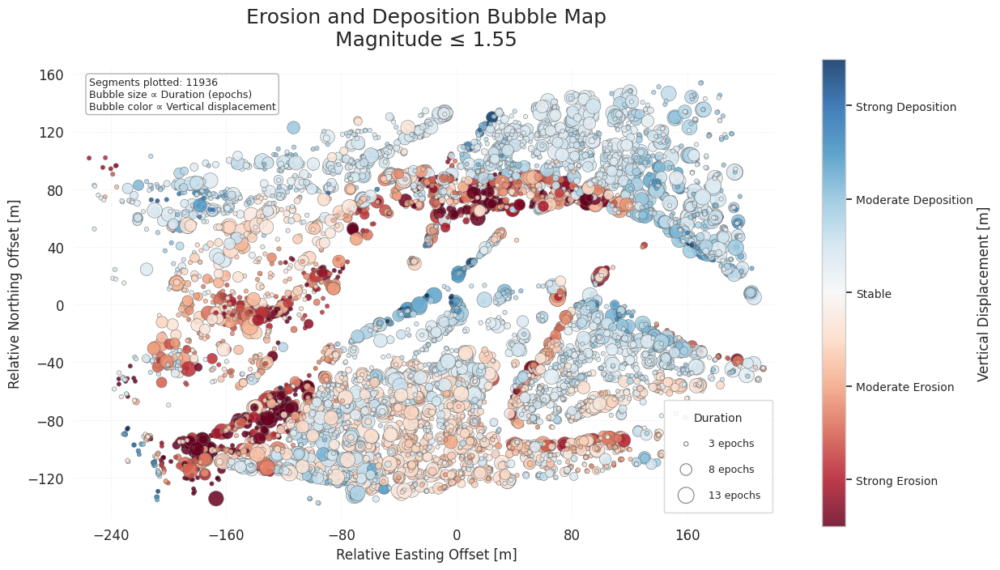

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from matplotlib import colors
from matplotlib.animation import FuncAnimation, PillowWriter
from google.colab import files

# --- Parameters ---
min_size, max_size = 15, 200
dur_min, dur_max = gdf_viz["duration"].min(), gdf_viz["duration"].max()
mag_min, mag_max = gdf_viz["magnitude"].min(), gdf_viz["magnitude"].max()

cmap = plt.cm.RdBu
norm = colors.Normalize(vmin=-1.0, vmax=1.0)

def compute_sizes(duration):
    return min_size + (duration - dur_min) / (dur_max - dur_min) * (max_size - min_size)

def jitter_points(df):
    np.random.seed(42)
    jitter = np.random.uniform(-0.5, 0.5, size=(len(df), 2))
    x_jittered = df.geometry.x + jitter[:, 0]
    y_jittered = df.geometry.y + jitter[:, 1]
    return x_jittered, y_jittered

# --- Magnitude thresholds ---
mag_bins = np.linspace(mag_min, mag_max, 20)

# --- Figure setup ---
fig2, ax2 = plt.subplots(figsize=(14, 10))
sc2 = ax2.scatter([], [], s=[], c=[], cmap=cmap, norm=norm,
                  edgecolors="#666666", linewidth=0.4, alpha=0.85)

# --- Colorbar with categorical labels ---
cbar2 = plt.colorbar(sc2, ax=ax2, shrink=0.75)
cbar2.set_label("Vertical Displacement [m]", fontsize=12)
cbar2.ax.tick_params(labelsize=10)
cbar2.set_ticks([-0.8, -0.4, 0.0, 0.4, 0.8])
cbar2.set_ticklabels([
    "Strong Erosion",
    "Moderate Erosion",
    "Stable",
    "Moderate Deposition",
    "Strong Deposition"
])

# --- Bubble size legend (duration epochs) ---
for_leg = []
for d in [dur_min, (dur_min + dur_max)//2, dur_max]:
    size = compute_sizes(d)
    for_leg.append(
        plt.scatter([], [], s=size, facecolors="none", edgecolors="gray",
                    linewidth=0.8, label=f"{int(d)} epochs")
    )

ax2.legend(
    handles=for_leg,
    title="Duration",
    loc="lower right",
    fontsize=9,
    title_fontsize=10,
    labelspacing=1.5,
    borderpad=1.2,
    handletextpad=1.2
)

# --- Title & labels ---
ax2.set_title(
    "Erosion and Deposition Bubble Map\nMont Saint Michel Bay",
    fontsize=18, pad=20
)
ax2.set_xlabel("Relative Easting Offset [m]", fontsize=12)
ax2.set_ylabel("Relative Northing Offset [m]", fontsize=12)

# --- Grid, ticks, limits ---
ax2.set_aspect("equal")
ax2.grid(True, linestyle="--", linewidth=0.5, alpha=0.3)
ax2.xaxis.set_major_locator(mticker.MaxNLocator(8))
ax2.yaxis.set_major_locator(mticker.MaxNLocator(8))
ax2.set_xlim(gdf_viz.geometry.x.min() - 10, gdf_viz.geometry.x.max() + 10)
ax2.set_ylim(gdf_viz.geometry.y.min() - 10, gdf_viz.geometry.y.max() + 10)

# --- Remove borders ---
for spine in ax2.spines.values():
    spine.set_visible(False)

# --- Annotation box ---
textstr = (
    f"Segments plotted: {len(gdf_viz)}\n"
    "Bubble size ∝ Duration (epochs)\n"
    "Bubble color ∝ Vertical displacement"
)
props = dict(boxstyle="round,pad=0.3", facecolor="white", edgecolor="gray", alpha=0.6)
ax2.text(
    0.02, 0.98,
    textstr,
    transform=ax2.transAxes,
    fontsize=9,
    verticalalignment="top",
    bbox=props
)

# --- Animation update ---
def update_magnitude(frame):
    thresh = mag_bins[frame]
    subset = gdf_viz[gdf_viz["magnitude"] <= thresh]
    if len(subset) == 0:
        sc2.set_offsets([])
        sc2.set_sizes([])
        sc2.set_array(np.array([]))
        ax2.set_title(
            f"Erosion and Deposition Bubble Map\nMagnitude ≤ {thresh:.2f} (No data)",
            fontsize=18, pad=20
        )
        return sc2,
    x_j, y_j = jitter_points(subset)
    sizes = compute_sizes(subset["duration"])
    points = np.column_stack([x_j, y_j])
    sc2.set_offsets(points)
    sc2.set_sizes(sizes)
    sc2.set_array(subset["magnitude"])
    ax2.set_title(
        f"Erosion and Deposition Bubble Map\nMagnitude ≤ {thresh:.2f}",
        fontsize=18, pad=20
    )
    return sc2,

# --- Build animation (slower for clarity) ---
ani_magnitude = FuncAnimation(
    fig2,
    update_magnitude,
    frames=len(mag_bins),
    blit=True,
    interval=1000,   # 1 second per frame
    repeat=True
)

# --- Save as GIF ---
ani_magnitude.save('animation_magnitude.gif', writer=PillowWriter(fps=1))

# --- Download in Colab ---
files.download('animation_magnitude.gif')


In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.io as pio

# --- Prepare Data ---
df = gdf_viz[(gdf_viz["duration"] >= 3) & (gdf_viz["duration"] <= 13)].copy()
np.random.seed(42)
df["x"] = df.geometry.x + np.random.uniform(-0.5, 0.5, len(df))
df["y"] = df.geometry.y + np.random.uniform(-0.5, 0.5, len(df))
df["duration_rounded"] = df["duration"].astype(int)
df = df.sort_values("duration_rounded")

x_min, x_max = df["x"].min(), df["x"].max()
y_min, y_max = df["y"].min(), df["y"].max()
color_min, color_max = -1.0, 1.0
unique_frames = df["duration_rounded"].sort_values().unique()

# --- Initialize figure ---
fig = go.Figure()

# --- Add traces for each duration frame ---
for i, dur in enumerate(unique_frames):
    subset = df[df["duration_rounded"] == dur]
    fig.add_trace(go.Scatter(
        x=subset["x"],
        y=subset["y"],
        mode='markers',
        marker=dict(
            size=subset["duration"],
            color=subset["magnitude"],
            colorscale='RdBu',
            cmin=color_min,
            cmax=color_max,
            showscale=False,
            line=dict(width=0.5, color='gray'),
            opacity=0.8
        ),
        name=str(dur),
        visible=(i == 0),
        hovertemplate=(
            "X: %{x:.2f} m<br>"
            "Y: %{y:.2f} m<br>"
            "Duration: %{customdata[0]}<br>"
            "Magnitude: %{customdata[1]:.2f}<extra></extra>"
        ),
        customdata=np.stack((subset["duration"], subset["magnitude"]), axis=-1)
    ))

# --- Add magnitude (color) legend ---
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='markers',
    marker=dict(
        colorscale='RdBu',
        cmin=color_min,
        cmax=color_max,
        showscale=True,
        colorbar=dict(
            title="Vertical Displacement",
            tickvals=[-0.8, -0.4, 0.0, 0.4, 0.8],
            ticktext=["Strong Erosion", "Moderate Erosion", "Stable", "Moderate Deposition", "Strong Deposition"],
            x=-0.22,
            y=0.5,
            len=0.8
        )
    ),
    hoverinfo='none',
    showlegend=False
))

# --- Add duration (size) legend with title ---
size_legend_values = [3, 8, 13]
size_legend_labels = ["Short Duration ", "Medium Duration ", "Long Duration "]

for s, label in zip(size_legend_values, size_legend_labels):
    fig.add_trace(go.Scatter(
        x=[None], y=[None],
        mode='markers',
        marker=dict(size=s, color='gray', opacity=0.6, line=dict(width=0.5, color='black')),
        showlegend=True,
        name=f'{label} ({s} Duration units)',
        legendgroup="Selected Duration"  # group under a title
    ))

# Update the layout to show the legend title
fig.update_layout(
    legend_title_text="Selected Duration"
)


# --- Build horizontal slider steps ---
traces_per_frame = len(unique_frames)
slider_steps = []
for i, dur in enumerate(unique_frames):
    visibility = [False] * (traces_per_frame + 1 + len(size_legend_values))
    visibility[i] = True  # frame points
    visibility[traces_per_frame] = True  # colorbar
    for j in range(traces_per_frame + 1, len(visibility)):
        visibility[j] = True  # size legend
    slider_steps.append(dict(method="update", label=str(dur), args=[{"visible": visibility}]))

custom_slider = [dict(
    active=0,
    yanchor="top",
    xanchor="left",
    currentvalue={"prefix": "Epoch Duration: "},
    pad={"b": 10, "t": 50},
    len=0.95,
    x=0.025,
    y=-0.20,
    steps=slider_steps
)]

# --- Layout ---
fig.update_layout(
    sliders=custom_slider,
    title=dict(
        text="Erosion and Deposition: Duration-Scaled Bubble Map<br>"
             "<sup>Bubble size ∝ Duration of change | Bubble color ∝ Vertical displacement</sup>",
        y=0.94, x=0.5, xanchor="center", yanchor="top"
    ),
    xaxis=dict(title="Relative Easting [m]", scaleanchor="y", scaleratio=1, range=[x_min, x_max]),
    yaxis=dict(title="Relative Northing [m]", range=[y_min, y_max]),
    margin=dict(l=80, r=40, t=140, b=120),
    height=750,
    showlegend=True
)

# --- Description Annotation ---
fig.add_annotation(
    text=(
        "<b>Map Overview:</b><br>"
        "- Bubble size ∝ duration<br>"
        "- Bubble color ∝ vertical displacement<br>"
        "- Use the slider to navigate through different epochs"
    ),
    align="left",
    showarrow=False,
    xref="paper", yref="paper",
    x=0.01, y=1.22,
    bordercolor="gray",
    borderwidth=1,
    borderpad=6,
    bgcolor="white",
    font=dict(size=12),
)

# --- Instruction Annotation ---
fig.add_annotation(
    text=(
        "<b>Interactive Guide:</b> Hover over each bubble to see its duration and displacement. "
        "Slide through epochs to observe spatiotemporal changes."
    ),
    align="left",
    showarrow=False,
    xref="paper", yref="paper",
    x=0.01, y=-0.30,
    bordercolor="gray",
    borderwidth=1,
    borderpad=6,
    bgcolor="white",
    font=dict(size=12),
)

# --- Save HTML ---
pio.write_html(fig, file="duration_interactive_map.html", auto_open=False)


In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.io as pio

# --- Prepare Data ---
df = gdf_viz.copy()

# Add jitter to avoid overlapping points
np.random.seed(42)
df["x"] = df.geometry.x + np.random.uniform(-0.5, 0.5, len(df))
df["y"] = df.geometry.y + np.random.uniform(-0.5, 0.5, len(df))

# --- Define magnitude bins with labels ---
mag_bins = [-1.0, -0.6, -0.2, 0.2, 0.6, 1.0]
mag_labels = ["Strong Erosion", "Moderate Erosion", "Stable", "Moderate Deposition", "Strong Deposition"]
df["magnitude_bin"] = pd.cut(df["magnitude"], bins=mag_bins, labels=mag_labels)

# --- Unique magnitude bins for slider ---
unique_bins = mag_labels

# --- Initialize figure ---
fig = go.Figure()

# --- Add traces for each magnitude bin ---
for i, label in enumerate(unique_bins):
    subset = df[df["magnitude_bin"] == label]
    fig.add_trace(go.Scatter(
        x=subset["x"],
        y=subset["y"],
        mode='markers',
        marker=dict(
            size=subset["duration"],
            color=subset["magnitude"],
            colorscale='RdBu',
            cmin=-1.0,
            cmax=1.0,
            line=dict(width=0.5, color='gray'),
            opacity=0.8,
            showscale=False
        ),
        name=label,
        visible=(i == 0),
        hovertemplate=(
            "<b>%{text}</b><br>"
            "Easting: %{x:.2f} m<br>"
            "Northing: %{y:.2f} m<br>"
            "Duration: %{customdata[0]}<br>"
            "Vertical Displacement: %{customdata[1]:.2f}<extra></extra>"
        ),
        text=[label]*len(subset),
        customdata=np.stack((subset["duration"], subset["magnitude"]), axis=-1)
    ))

# --- Add magnitude colorbar ---
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='markers',
    marker=dict(
        colorscale='RdBu',
        cmin=-1.0,
        cmax=1.0,
        showscale=True,
        colorbar=dict(
            title="Vertical Displacement",
            tickmode="array",
            tickvals=[-0.8, -0.4, 0.0, 0.4, 0.8],
            ticktext=mag_labels,
            x=-0.2,
            y=0.5,
            len=0.8
        )
    ),
    hoverinfo='none',
    showlegend=False
))

# --- Add duration size legend ---
size_legend_values = [3, 8, 13]
for s in size_legend_values:
    fig.add_trace(go.Scatter(
        x=[None], y=[None],
        mode='markers',
        marker=dict(
            size=s,
            color="lightgray",
            line=dict(width=0.5, color='gray')
        ),
        legendgroup="Duration",
        showlegend=True,
        name=f"{s} duration units"
    ))

# --- Build horizontal slider steps ---
traces_per_bin = len(unique_bins)
slider_steps = []
for i, label in enumerate(unique_bins):
    visibility = [False]*(traces_per_bin + 1 + len(size_legend_values))  # +1 for colorbar
    visibility[i] = True                # show bin points
    visibility[traces_per_bin] = True   # show colorbar
    for j in range(traces_per_bin + 1, len(visibility)):
        visibility[j] = True            # show size legend
    slider_steps.append(dict(
        method="update",
        label=label,
        args=[{"visible": visibility}]
    ))

custom_slider = [dict(
    active=0,
    yanchor="top",
    xanchor="left",
    currentvalue={"prefix": "Magnitude Bin: "},
    pad={"b": 10, "t": 50},
    len=0.95,
    x=0.025,
    y=-0.20,
    steps=slider_steps
)]

# --- Layout ---
fig.update_layout(
    sliders=custom_slider,
    title=dict(
        text="Erosion and Deposition: Magnitude-Scaled Bubble Map<br>"
             "<sup>Bubble size ∝ Duration | Bubble color ∝ Vertical displacement</sup>",
        y=0.94, x=0.5,
        xanchor="center", yanchor="top"
    ),
    xaxis=dict(title="Easting [m]", scaleanchor="y", scaleratio=1),
    yaxis=dict(title="Northing [m]"),
    height=750,
    margin=dict(l=120, r=150, t=150, b=150),
    showlegend=True,
    legend=dict(title="Magnitude Bin")
)

# --- Description Annotation ---
fig.add_annotation(
    text=(
        "<b>Map Description:</b><br>"
        "- Bubble size ∝ Duration<br>"
        "- Bubble color ∝ Vertical Displacement<br>"
        "- Use the slider to view different magnitude bins"
    ),
    align="left",
    showarrow=False,
    xref="paper", yref="paper",
    x=0.01, y=1.25,
    bordercolor="gray",
    borderwidth=1,
    borderpad=6,
    bgcolor="white",
    font=dict(size=12),
)

# --- User Instruction Annotation Below the Map ---
fig.add_annotation(
    text=(
        "<b>Note:</b> Use the slider to filter points by magnitude bin. "
        "Hover over points to view duration and vertical displacement."
    ),
    align="left",
    showarrow=False,
    xref="paper", yref="paper",
    x=0.01, y=-0.30,
    bordercolor="gray",
    borderwidth=1,
    borderpad=6,
    bgcolor="white",
    font=dict(size=12),
)

# --- Save HTML file ---
pio.write_html(fig, file="magnitude_interactive_map.html", auto_open=True)


In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.io as pio

# --- Copy and jitter coordinates ---
df = gdf_viz.copy()
df["x"] = df.geometry.x + np.random.uniform(-0.5, 0.5, len(df))
df["y"] = df.geometry.y + np.random.uniform(-0.5, 0.5, len(df))
df["duration_rounded"] = df["duration"].astype(int)

# --- Define magnitude bins ---
mag_bins = [-1.0, -0.6, -0.2, 0.2, 0.6, 1.0]
mag_labels = ["Strong Erosion", "Moderate Erosion", "Stable", "Moderate Deposition", "Strong Deposition"]
df["magnitude_bin"] = pd.cut(df["magnitude"], bins=mag_bins, labels=mag_labels)

# --- Unique durations for dropdown ---
unique_durations = sorted(df["duration_rounded"].unique())

# --- Initialize figure ---
fig = go.Figure()

# --- Add traces for each combination of duration & magnitude bin ---
for duration in unique_durations:
    for i, label in enumerate(mag_labels):
        subset = df[(df["duration_rounded"] == duration) & (df["magnitude_bin"] == label)]
        fig.add_trace(go.Scatter(
            x=subset["x"],
            y=subset["y"],
            mode='markers',
            marker=dict(
                size=subset["duration"],
                color=subset["magnitude"],
                colorscale='RdBu',
                cmin=-1.0,
                cmax=1.0,
                showscale=False,  # Hide individual trace colorbars
                line=dict(width=0.5, color='gray'),
                opacity=0.8
            ),
            name=f"{label} - Duration {duration}",
            visible=(duration == unique_durations[0] and i == 0),
            hovertemplate=(
                "<b>%{text}</b><br>"
                "Easting: %{x:.2f} m<br>"
                "Northing: %{y:.2f} m<br>"
                "Duration: %{customdata[0]} yrs<br>"
                "Vertical Displacement: %{customdata[1]:.2f}<extra></extra>"
            ),
            text=[label]*len(subset),
            customdata=np.stack((subset["duration"], subset["magnitude"]), axis=-1)
        ))

# --- Add dedicated colorbar trace (always visible, on the left) ---
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='markers',
    marker=dict(
        colorscale='RdBu',
        cmin=-1.0,
        cmax=1.0,
        showscale=True,
        colorbar=dict(
            title="Vertical Displacement",
            tickmode="array",
            tickvals=[-0.8, -0.4, 0.0, 0.4, 0.8],  # centers of bins
            ticktext=mag_labels,
            x=-0.22,   # shift left to avoid y-axis overlap
            y=0.5,
            len=0.8
        )
    ),
    hoverinfo='none',
    showlegend=False
))

# --- Build visibility matrix ---
traces_per_duration = len(mag_labels)

# Dropdown (by duration)
dropdown_buttons = []
for idx, duration in enumerate(unique_durations):
    visibility = [False] * (len(unique_durations) * traces_per_duration + 1)  # +1 for colorbar trace
    for j in range(traces_per_duration):
        visibility[idx * traces_per_duration + j] = True
    visibility[-1] = True  # keep colorbar trace visible
    dropdown_buttons.append(
        dict(label=f"Duration {duration}",
             method="update",
             args=[{"visible": visibility}])
    )

# Slider (by magnitude bin)
slider_steps = []
for i, label in enumerate(mag_labels):
    visibility = [False] * (len(unique_durations) * traces_per_duration + 1)
    for j in range(len(unique_durations)):
        visibility[j * traces_per_duration + i] = True
    visibility[-1] = True
    slider_steps.append(dict(
        method="update",
        label=label,
        args=[{"visible": visibility}]
    ))

# --- Layout ---
fig.update_layout(
    updatemenus=[dict(
        buttons=dropdown_buttons,
        direction="down",
        x=0.5,
        xanchor="center",
        y=1.25,  # moved dropdown higher
        yanchor="top",
        showactive=True,
        pad={"r": 10, "t": 10},
    )],
    sliders=[dict(
        active=0,
        steps=slider_steps,
        pad={"t": 60},
        currentvalue={"prefix": "Magnitude Bin: "},
        x=0.025,
        y=-0.25,  # moved slider lower
    )],
    title=dict(
        text="Erosion and Deposition Bubble Map<br><sup>Interactive View: Duration Filter and Magnitude Slider</sup>",
        y=0.94, x=0.5,
        xanchor="center", yanchor="top"
    ),
    xaxis=dict(title="Relative Easting Offset [m]", scaleanchor="y", scaleratio=1),
    yaxis=dict(title="Relative Northing Offset [m]"),
    margin=dict(l=80, r=40, t=160, b=150),  # increased top and bottom margins
    height=750
)

# --- Add Description Annotation ---
fig.add_annotation(
    text=(
        "<b>Map Description:</b><br>"
        "- Bubble size ∝ Duration<br>"
        "- Bubble color ∝ Vertical Displacement<br>"
        "- Use the dropdown to filter by Duration<br>"
        "- Use the slider to filter by Magnitude Bin"
    ),
    align="left",
    showarrow=False,
    xref="paper", yref="paper",
    x=0.01, y=1.28,  # moved description above dropdown
    bordercolor="gray",
    borderwidth=1,
    borderpad=6,
    bgcolor="white",
    font=dict(size=12),
)

# --- Add User Instruction Annotation Below the Map ---
fig.add_annotation(
    text=(
        "<b>Note:</b> The Duration dropdown and Magnitude slider operate independently. "
        "Selecting a Duration filters the points displayed, while moving the Magnitude slider filters points by Magnitude Bin."
    ),
    align="left",
    showarrow=False,
    xref="paper", yref="paper",
    x=0.01, y=-0.35,  # moved bottom note lower
    bordercolor="gray",
    borderwidth=1,
    borderpad=6,
    bgcolor="white",
    font=dict(size=12),
)

# --- Save HTML file ---
pio.write_html(fig, file="interactive_map_combination.html", auto_open=False)

In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.io as pio

# --- Load timestamps CSV ---
timestamps_path = "/content/drive/MyDrive/phase1_seasonal_38/timestamps.csv"
df_timestamps = pd.read_csv(timestamps_path)
df_timestamps['timestamp'] = pd.to_datetime(df_timestamps['timestamp'])
print("Timestamps CSV loaded:")
print(df_timestamps.head())

# --- Assign start epoch to each segment ---
start_epochs = [seg.start_epoch for seg in all_objects]

gdf_segments['start_epoch'] = start_epochs
gdf_segments['timestamp'] = gdf_segments['start_epoch'].apply(
    lambda x: df_timestamps.loc[x, 'timestamp']
)

# Filter visualization dataset
gdf_viz = gdf_segments[
    (gdf_segments["magnitude"].abs() > 0.1) &
    (gdf_segments["duration"] >= 3)
].copy()

print(f"\nNumber of segments in gdf_segments: {len(gdf_segments)}")
print(gdf_segments[['duration', 'magnitude', 'geometry', 'start_epoch', 'timestamp']].head())

print(f"\nNumber of segments in gdf_viz after filtering: {len(gdf_viz)}")
print(gdf_viz[['duration', 'magnitude', 'geometry', 'start_epoch', 'timestamp']].head())

print("\nAny NaNs in gdf_viz?")
print(gdf_viz.isna().any())


# ---------------- PLOTTING ---------------- #

df = gdf_viz.copy()

# Add jitter for visibility
df["x"] = df.geometry.x + np.random.uniform(-0.5, 0.5, len(df))
df["y"] = df.geometry.y + np.random.uniform(-0.5, 0.5, len(df))

# All available timestamps
all_timestamps = df_timestamps["timestamp"].dt.to_period("M").astype(str).unique()
timestamps = sorted(all_timestamps)

# Convert segment start timestamp to string (monthly period)
df["timestamp_str"] = pd.to_datetime(df["timestamp"]).dt.to_period("M").astype(str)

# Map each start timestamp to its index in the global timeline
ts_index_map = {ts: i for i, ts in enumerate(timestamps)}
df["start_idx"] = df["timestamp_str"].map(ts_index_map)

# Compute end index = start + duration
df["end_idx"] = df["start_idx"] + df["duration"]

# Magnitude bins
mag_bins = [-1.0, -0.6, -0.2, 0.2, 0.6, 1.0]
mag_labels = ["Strong Erosion", "Moderate Erosion", "Stable",
              "Moderate Deposition", "Strong Deposition"]
df["magnitude_bin"] = pd.cut(df["magnitude"], bins=mag_bins, labels=mag_labels)

# --- Initialize figure ---
fig = go.Figure()

# --- Add traces for each timestamp ---
for i, ts in enumerate(timestamps):
    # Only keep bubbles whose lifetime includes this frame
    subset = df[(df["start_idx"] <= i) & (df["end_idx"] > i)]

    fig.add_trace(go.Scatter(
        x=subset["x"],
        y=subset["y"],
        mode='markers',
        marker=dict(
            size=subset["duration"],
            color=subset["magnitude"],
            colorscale='RdBu',
            cmin=-1.0,
            cmax=1.0,
            line=dict(width=0.5, color='gray'),
            opacity=0.8,
            showscale=False
        ),
        name=ts,
        visible=(i == 0),
        hovertemplate=(
            "<b>%{text}</b><br>"
            "Easting: %{x:.2f} m<br>"
            "Northing: %{y:.2f} m<br>"
            "Duration: %{customdata[0]} epochs<br>"
            "Vertical Displacement: %{customdata[1]:.2f} m<br>"
            "Start Timestamp: %{customdata[2]}<br>"
            "Current Frame: " + ts + "<extra></extra>"
        ),
        text=subset["magnitude_bin"].astype(str),
        customdata=np.stack((
            subset["duration"].astype(float),
            subset["magnitude"].astype(float),
            subset["timestamp"].astype(str)   # safe conversion
        ), axis=-1)
    ))

# --- Fixed colorbar for magnitude ---
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='markers',
    marker=dict(
        colorscale='RdBu',
        cmin=-1.0,
        cmax=1.0,
        showscale=True,
        colorbar=dict(
            title="Vertical Displacement",
            tickmode="array",
            tickvals=[-0.8, -0.4, 0.0, 0.4, 0.8],
            ticktext=mag_labels,
            x=-0.2, y=0.5, len=0.8
        )
    ),
    hoverinfo='none',
    showlegend=False
))

# --- Bubble size legend with title ---
legend_text = "Duration (epochs)"
size_legend_values = [3, 8, 13]
for s in size_legend_values:
    fig.add_trace(go.Scatter(
        x=[None], y=[None],
        mode='markers',
        marker=dict(
            size=s,
            color="lightgray",
            line=dict(width=0.5, color='gray')
        ),
        legendgroup="Duration",
        showlegend=True,
        name=f"{s} duration unit"
    ))

# Add legend title
fig.update_layout(
    legend=dict(title="Selected Timestamp")
)

# --- Slider for timestamps ---
steps = []
for i, ts in enumerate(timestamps):
    visibility = [False]*(len(timestamps)+1+len(size_legend_values))
    visibility[i] = True
    visibility[len(timestamps)] = True
    for j in range(len(size_legend_values)):
        visibility[len(timestamps)+1+j] = True
    steps.append(dict(
        method="update",
        label=ts,
        args=[{"visible": visibility}],
    ))

sliders = [dict(
    active=0,
    steps=steps,
    currentvalue={"prefix": "Timestamp: "},
    pad={"t": 50},
    x=0.05, y=-0.2
)]

# --- Layout ---
fig.update_layout(
    sliders=sliders,
    title=dict(
        text="Erosion and Deposition Bubble Map<br><sup>Bubbles Persist Only for Their Duration</sup>",
        y=0.94, x=0.5, xanchor="center", yanchor="top"
    ),
    xaxis=dict(title="Easting [m]", scaleanchor="y", scaleratio=1),
    yaxis=dict(title="Northing [m]"),
    height=750,
    margin=dict(l=120, r=150, t=150, b=150),
)

# --- Add Description Annotation ---
fig.add_annotation(
    text=(
        "<b>Map Description:</b><br>"
        "- Bubble size ∝ Duration<br>"
        "- Bubble color ∝ Vertical Displacement<br>"
        "- Each bubble appears at its start time<br>"
        "- Disappears after its duration is complete"
    ),
    align="left",
    showarrow=False,
    xref="paper", yref="paper",
    x=0.01, y=1.25,
    bordercolor="gray",
    borderwidth=1,
    borderpad=6,
    bgcolor="white",
    font=dict(size=12),
)

# --- Save HTML ---
pio.write_html(fig, file="commulative_interactive_map_timestamps.html", auto_open=True)


Timestamps CSV loaded:
                   filename  timestamp
0  2009_07_09_Site2_tls.las 2009-07-09
1  2009_08_04_Site2_tls.las 2009-08-04
2  2009_10_28_Site2_tls.las 2009-10-28
3  2010_09_07_Site2_tls.las 2010-09-07
4  2010_09_08_Site2_tls.las 2010-09-08

Number of segments in gdf_segments: 16907
   duration  magnitude                 geometry  start_epoch  timestamp
0        12  -1.101768  POINT (-120.735 -3.841)            8 2010-10-04
1        12  -1.347530    POINT (90.191 70.492)           13 2011-07-22
2         3  -2.004449    POINT (10.792 78.012)           34 2013-04-03
3         5  -1.048839  POINT (-118.717 -0.099)            3 2010-09-07
4         3  -1.367368  POINT (-123.184 -4.002)            7 2010-09-11

Number of segments in gdf_viz after filtering: 11936
   duration  magnitude                 geometry  start_epoch  timestamp
0        12  -1.101768  POINT (-120.735 -3.841)            8 2010-10-04
1        12  -1.347530    POINT (90.191 70.492)           13 2011-07-2

In [ ]:
import pandas as pd

# Load CSV
csv_files = pd.read_csv("/content/drive/MyDrive/phase1_seasonal_38/timestamps.csv")
csv_files['timestamp'] = pd.to_datetime(csv_files['timestamp'])

# Assume your processed epochs are 0 → 36
processed_epoch_indices = list(range(37))

# Map CSV files to epochs (assuming CSV order matches epochs)
csv_files['epoch_index'] = range(len(csv_files))

# Files that correspond to processed epochs
processed_files = csv_files[csv_files['epoch_index'].isin(processed_epoch_indices)]
print("Processed CSV files:\n", processed_files)

# Files that were not processed
missing_files = csv_files[~csv_files['epoch_index'].isin(processed_epoch_indices)]
print("\nCSV files NOT processed:\n", missing_files)


Processed CSV files:
                          filename  timestamp  epoch_index
0        2009_07_09_Site2_tls.las 2009-07-09            0
1        2009_08_04_Site2_tls.las 2009-08-04            1
2        2009_10_28_Site2_tls.las 2009-10-28            2
3        2010_09_07_Site2_tls.las 2010-09-07            3
4        2010_09_08_Site2_tls.las 2010-09-08            4
5        2010_09_09_Site2_tls.las 2010-09-09            5
6        2010_09_10_Site2_tls.las 2010-09-10            6
7        2010_09_11_Site2_tls.las 2010-09-11            7
8        2010_10_04_Site2_tls.las 2010-10-04            8
9        2010_10_07_Site2_tls.las 2010-10-07            9
10       2010_10_08_Site2_tls.las 2010-10-08           10
11       2010_10_11_Site2_tls.las 2010-10-11           11
12       2010_10_22_Site2_tls.las 2010-10-22           12
13       2011_07_22_Site2_tls.las 2011-07-22           13
14       2011_09_23_Site2_tls.las 2011-09-23           14
15       2011_09_26_Site2_tls.las 2011-09-26      

In [ ]:
# Assuming gdf_viz rows have a 'start_epoch' column corresponding to CSV epoch_index
epoch_to_timestamp = csv_files.set_index('epoch_index')['timestamp'].to_dict()

# Add a timestamp column to gdf_viz
gdf_viz['timestamp'] = gdf_viz['start_epoch'].map(epoch_to_timestamp)

print(gdf_viz[['start_epoch', 'timestamp', 'duration', 'magnitude']].head())


   start_epoch  timestamp  duration  magnitude
0            8 2010-10-04        12  -1.101768
1           13 2011-07-22        12  -1.347530
2           34 2013-04-03         3  -2.004449
3            3 2010-09-07         5  -1.048839
4            7 2010-09-11         3  -1.367368


In [ ]:
import pandas as pd

# Ensure the timestamp column is datetime
gdf_viz["timestamp"] = pd.to_datetime(gdf_viz["timestamp"])

# Check the earliest and latest timestamps
print("Earliest timestamp:", gdf_viz["timestamp"].min())
print("Latest timestamp:", gdf_viz["timestamp"].max())

# Optionally, see all unique years present
print("Years present in data:", sorted(gdf_viz["timestamp"].dt.year.unique()))


Earliest timestamp: 2009-07-09 00:00:00
Latest timestamp: 2013-04-03 00:00:00
Years present in data: [np.int32(2009), np.int32(2010), np.int32(2011), np.int32(2012), np.int32(2013)]


https://maryam-source.github.io/thesis-interactive-maps/interactive_map_duration.html


https://maryam-source.github.io/thesis-interactive-maps/interactive_map_magnitude.html

https://maryam-source.github.io/thesis-interactive-maps/interactive_map_combination.html


https://maryam-source.github.io/thesis-interactive-maps/interactive_map_timestamps.html
